In [1]:
#%reset

In [2]:
from tqdm import tqdm
import numpy as np
import pandas as pd
import lxml
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import seaborn as sns
from matplotlib import colors as mcolors
import colorsys
import folium
import warnings
from collections import Counter
warnings.filterwarnings("ignore")
sns.set_palette("tab10")
pd.set_option('display.max_columns', None) #We want to see all columns of our dataset. 

In [3]:
#We make a function that read our saved excel files. And make it a df and remove the row index from when we saved the file. 

def read_saved_excel(Excel_string_name):
    read_df = pd.read_excel(Excel_string_name)    #Get the data from our saved excel
    read_df = pd.DataFrame(read_df) #make it to a dataframe in Python, with the Pandas inbuild function
    read_df.drop('Unnamed: 0', axis=1, inplace=True) #Remove the created row index from when we saved the file
    return read_df

In [4]:

#df = read_saved_excel("fine_cleaning_06_Nov.xlsx")
df = pd.read_csv("fine_cleaning_06_Nov.csv")

print('Columns length : ' + str(len(df.columns)))
print('Rows length : ' + str(len(df)))


Columns length : 93
Rows length : 34202


* #### Change class

Nummerical

In [5]:
df['energy_law_applies'] = df['energy_law_applies'].astype(np.int64)
df['presale'] = df['presale'].astype(np.int64)
df['num_floors'] = df['num_floors'].astype(np.int64)
df['num_rooms'] = df['num_rooms'].astype(np.int64)
df['year_built'] = df['year_built'].astype(np.int64)
df['sold_price'] = df['sold_price'].astype(np.float64)
df['num_toilets'] = df['num_toilets'].astype(np.int64)
df['num_bathrooms'] = df['num_bathrooms'].astype(np.int64)
df['floors_in_building'] = df['floors_in_building'].astype(np.int64)
df['addressFloor'] = df['addressFloor'].astype(np.int64)
df['OMXC_25'] = df['OMXC_25'].astype(np.float64)


Categorical

In [6]:
df['type'] = df['type'].astype('category')
df['energy_label_classification'] = df['energy_label_classification'].astype('category')
df['usageType'] = df['usageType'].astype('category')
df['toiletType'] = df['toiletType'].astype('category')
df['bathroomType'] = df['bathroomType'].astype('category')
df['kitchenType'] = df['kitchenType'].astype('category')
df['roofType'] = df['roofType'].astype('category')
df['outWallMaterialType'] = df['outWallMaterialType'].astype('category')
df['heating_code'] = df['heating_code'].astype('category')
df['heating_code_additional'] = df['heating_code_additional'].astype('category')
df['zipCode'] = df['zipCode'].astype('category')
df['cityName'] = df['cityName'].astype('category')
df['municipality'] = df['municipality'].astype('category')
df['radonRisk'] = df['radonRisk'].astype('category')
df['noiseLvl'] = df['noiseLvl'].astype('category')
df['floodRisk'] = df['floodRisk'].astype('category')
df['burglaryRisk'] = df['burglaryRisk'].astype('category')
df['conservationValue'] = df['conservationValue'].astype('category')
df['biggestParty'] = df['biggestParty'].astype('category')
df['votingArea'] = df['votingArea'].astype('category')
df['addressName'] = df['addressName'].astype('category')
df['addressNumber'] = df['addressNumber'].astype('category')
df['addressDoor'] = df['addressDoor'].astype('category')



# Data Exploration


In [7]:

#df.describe().to_excel("numerical variables.xlsx")

In [8]:
df.info(null_counts=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34202 entries, 0 to 34201
Data columns (total 93 columns):
 #   Column                                    Dtype   
---  ------                                    -----   
 0   type                                      category
 1   energy_law_applies                        int64   
 2   energy_label_classification               category
 3   presale                                   int64   
 4   year_built                                int64   
 5   year_renovated                            float64 
 6   sold_price                                float64 
 7   saleDate                                  object  
 8   saleYear                                  int64   
 9   num_floors                                int64   
 10  floors_in_building                        int64   
 11  num_rooms                                 int64   
 12  num_toilets                               int64   
 13  num_bathrooms                             int6

In [9]:
list(df.columns)

['type',
 'energy_law_applies',
 'energy_label_classification',
 'presale',
 'year_built',
 'year_renovated',
 'sold_price',
 'saleDate',
 'saleYear',
 'num_floors',
 'floors_in_building',
 'num_rooms',
 'num_toilets',
 'num_bathrooms',
 'living_area',
 'basement_area',
 'weighted_area',
 'built_in_outhouse_area',
 'carport_area',
 'garage_outhouse_free_area',
 'conservatory_area',
 'built_in_garage',
 'lot',
 'usageType',
 'toiletType',
 'bathroomType',
 'kitchenType',
 'roofType',
 'outWallMaterialType',
 'heating_code',
 'heating_code_additional',
 'zipCode',
 'cityName',
 'municipality',
 'addressFloor',
 'm2Price_WA',
 'Water_view',
 'Balcony',
 'Opp_for_balcony',
 'Rooftop_Terrace',
 'Terrace',
 'House_Animals',
 'wgs84_lat',
 'wgs84_lon',
 'school',
 'roadtrain',
 'junction',
 'daycare',
 'metro',
 'doctor',
 'soccerfield',
 'hospital',
 'stop',
 'lake',
 'supermarket',
 'pharmacy',
 'strain',
 'airport',
 'train',
 'library',
 'publicbath',
 'coast',
 'sportshall',
 'forest',
 

In [10]:
df["type"].value_counts()

condo              28364
villa               3389
terraced house      1338
villa apartment     1111
Name: type, dtype: int64

In [11]:
def HistPlotting(df_input):
    
    for i in range(len(df_input.columns)):
        nameColumn = list(df_input.columns)[i]
        plt.figure(figsize=(17,7))
        #sns.histplot(df_input[nameColumn])
        ax = sns.countplot(df[nameColumn], order = df[nameColumn].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
        plt.xlabel('Column: ' + nameColumn, fontsize=12)
        plt.ylabel('Count', fontsize=12)
        plt.title('Counts of column: ' + nameColumn, fontsize=14)
        
        for p in ax.patches:
            ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.
        plt.autoscale()
        plt.xticks(rotation = 45)
        #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Histplot of Column ' + nameColumn +'.png', bbox_inches='tight')
        #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Histplot of Column ' + nameColumn +'.png', bbox_inches='tight')
        None #don't show the label objects
    


In [12]:
def plot_Combine(nrow, ncol, list_variables, FigureName):
    
    
    plt.subplots(nrow, ncol,  sharex=False, figsize=(17, 10))
    for i in range(0, len(list_variables)):
        
        plt.subplot(nrow, ncol, (i+1))
        
        ax = sns.countplot(df[list_variables[i]], order = df[list_variables[i]].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
        ax.set_xticklabels(ax.get_xticklabels(), fontsize=7, rotation = 25)
        for p in ax.patches:
                    ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.
        
        plt.xlabel('')
        plt.ylabel('Count', fontsize=0.5)
        plt.title('Counts of column: ' + list_variables[i] , fontsize=8)
        plt.autoscale()

        plt.subplots_adjust(hspace = 0.5)
    
    
    plt.suptitle(FigureName)    
    
    #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/' + FigureName + '.png', bbox_inches='tight')
    #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/' + FigureName + '.png', bbox_inches='tight')
    
    None
    return

In [13]:
PlotThem = df[['zipCode','cityName','type', 'energy_label_classification', 'presale', 'floors_in_building', 'num_rooms', 'num_toilets', 'num_bathrooms', 'usageType', 'toiletType', 'bathroomType', 'kitchenType', 'roofType', 'outWallMaterialType', 'heating_code', 'heating_code_additional', 'radonRisk', 'noiseLvl', 'floodRisk', 'MAS', 'burglaryRisk', 'conservationValue', 'biggestParty', 'voterTurnout', 'votingArea']]


#HistPlotting(PlotThem)

* ## Remove zipCode and voting area

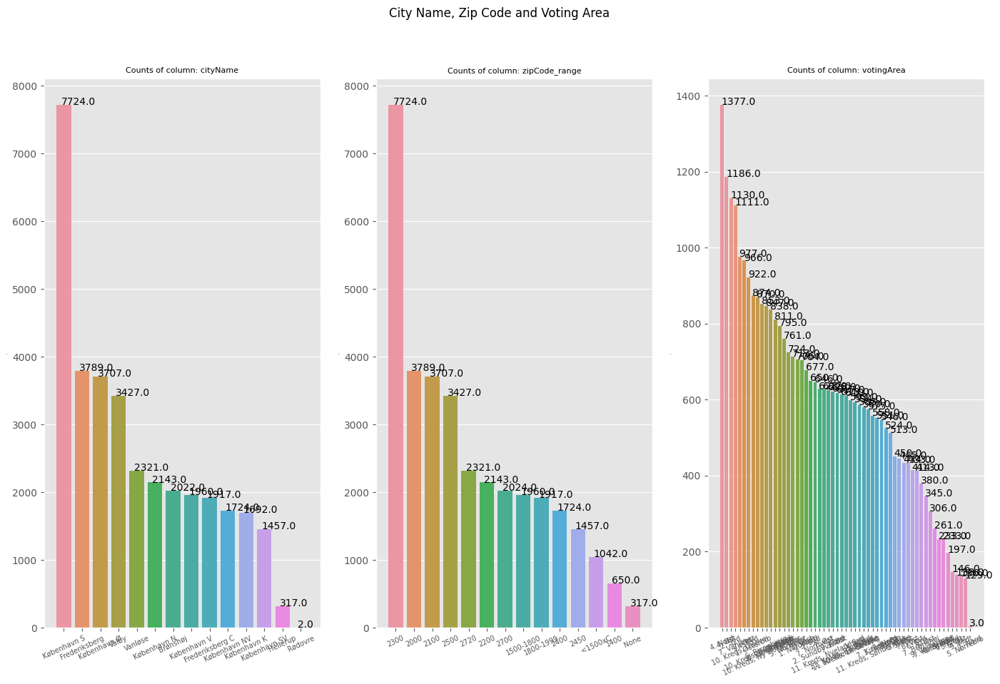

In [14]:
    ### Postal ID
df['zipCode'] = df['zipCode'].astype('int')
# Handling Christianshavn
df.loc[(df['zipCode'].astype('int') >= 1400) & (df['zipCode'].astype('int') <= 1448), ['zipCode']] = 666
df['zipCode'] = df['zipCode'].astype('category')


bins = [0,      999,      1500,        1800,        2000,
        2001,   2101,  2151,  2201,  2301,   2401,  2451,   2501,
        2701,  2721] #16
names = ['1400' ,'<1500xC', '1500-1800', '1800-1999', '2000',
         '2100','2150','2200','2300', '2400', '2450',
         '2500', '2700', '2720'] #15
# <1500xC means zip codes up to 1500 but eXclusive (C)hristianshavn which has 1400-1448

d = dict(enumerate(names,1))
df['zipCode_range'] = np.vectorize(d.get)(np.digitize(df['zipCode'],bins))
df['zipCode_range'] = df['zipCode_range'].astype('category')
df['zipCode_range'].value_counts()



plot_Combine(1,3,['cityName', 'zipCode_range', 'votingArea'], 'City Name, Zip Code and Voting Area')


In [15]:
len(df['votingArea'].drop_duplicates())#[['cityName', 'zipCode_range', 'votingArea']]

57

In [16]:
#We drop zipCode and VotingArea, as we see the zipCode division like Johan made, 
# is nearly the same as our CityName, so no need for two indentical variables.
#And we drop votingArea

df.drop(columns=['zipCode', 'zipCode_range', 'votingArea'], inplace = True)

In [17]:
len(df.columns)

91

* ## Remove obs

In [18]:
Counter(df['Rooftop_Terrace'])


Counter({0: 34181, 1: 21})

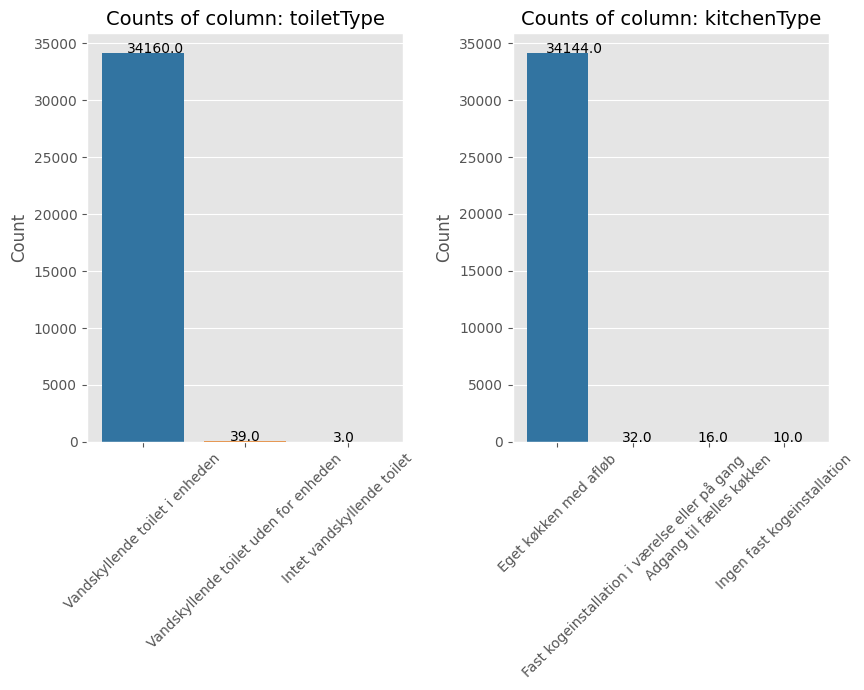

In [19]:

plt.figure(figsize=(17,7))
# plt.subplot(1, 4, 1)

# ax = sns.countplot(df['cityName'], order = df['cityName'].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
# for p in ax.patches:
#             ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.

# plt.xlabel('')
# plt.ylabel('Count', fontsize=12)
# plt.title('Counts of column: cityName', fontsize=14)
# plt.autoscale()
# plt.xticks(rotation = 90)
###########

plt.subplot(1, 4, 1)
ax2 = sns.countplot(df['toiletType'], order = df['toiletType'].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
for p in ax2.patches:
            ax2.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.
plt.xlabel('')
plt.ylabel('Count', fontsize=12)
plt.title('Counts of column: toiletType', fontsize=14)
plt.autoscale()            
plt.xticks(rotation = 45)

###########
plt.subplot(1, 4, 2)
ax3 = sns.countplot(df['kitchenType'], order = df['kitchenType'].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
for p in ax3.patches:
            ax3.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.
            
plt.xlabel('')
plt.ylabel('Count', fontsize=12)
plt.title('Counts of column: kitchenType', fontsize=14)
plt.autoscale()
plt.xticks(rotation = 45)



plt.tight_layout()
plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/RemoveObs' + '.png', bbox_inches='tight')
plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/RemoveObs' + '.png', bbox_inches='tight')

None

In [20]:
len(df)

34202

In [21]:
#We remove 'Rødovre' from cityName, as we above can see there only are 2 observations.

df['cityName'] = df['cityName'].astype('object') #Because it is a category, we have to change it to object, before we delete. And then after we again insert as category. 
drop_city = list(df.loc[(df['cityName']=='Rødovre')].index)

df.drop(drop_city, inplace=True)


In [22]:
df['cityName'] = df['cityName'].astype('category')

In [23]:
len(df)

34200

In [24]:
#Remove toiletType, because we only have 42 obs there are not having toilet in the unit. So first we remove these obs. And then the column.
drop_toiletType = list(df.loc[~(df['toiletType']=='Vandskyllende toilet i enheden')].index)

df.drop(drop_toiletType, inplace=True)
df.drop(columns=['toiletType'], inplace=True)

In [25]:
len(df)

34158

In [26]:
#We remove KitchenType, because we only have 50 (58 before deleting above) obs that does not have it own kitchen in the unit. So first we remove these obs. And then the column.

len(df.loc[~(df['kitchenType']=='Eget køkken med afløb')])

50

In [27]:
drop_kitchenType = list(df.loc[~(df['kitchenType']=='Eget køkken med afløb')].index)

df.drop(drop_kitchenType, inplace=True)
df.drop(columns=['kitchenType'], inplace=True)

In [28]:
len(df)

34108

* ##  Combine categories

In [29]:
#De bevaringsværdige bygningerne har forskellige grader af bevaringsværdi, 
# angivet ved en karakter, der går fra 1 til 9, hvor 
# 1-3 regnes for en høj bevaringsværdi, 
# 4-6 for middel og 
# 7-9 for lav værdi. 
# Hvor fredede huse absolut ikke må rives ned, er det op til kommunalbestyrelsen
# at beslutte om et bevaringsværdigt hus må ændres, ombygges eller rives ned.

#https://www.dingeo.dk/data/fbb/

In [30]:
combine_list = ['noiseLvl', 'burglaryRisk', 'energy_label_classification', 'radonRisk',  'outWallMaterialType', 'roofType', 'bathroomType', 'heating_code', 'conservationValue' ]

In [31]:
len(combine_list)

9

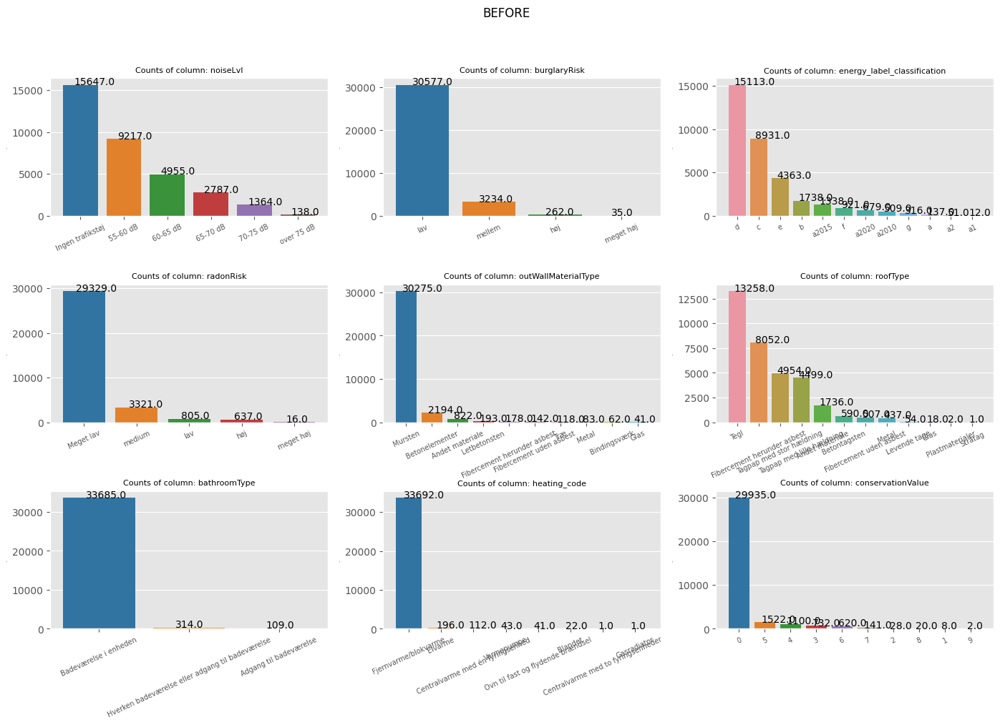

In [32]:
plot_Combine(3, 3, combine_list, 'BEFORE')

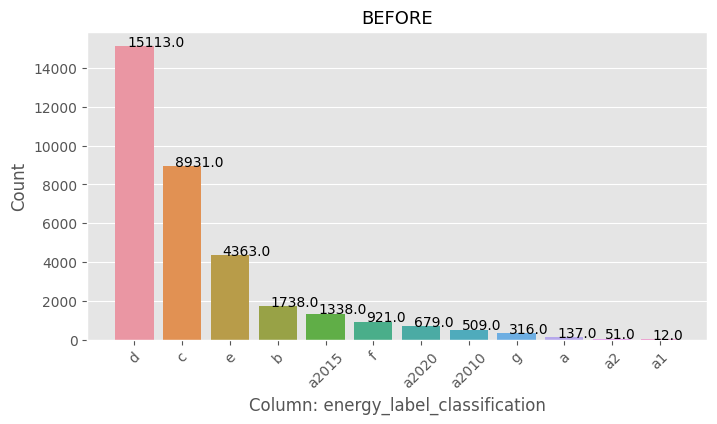

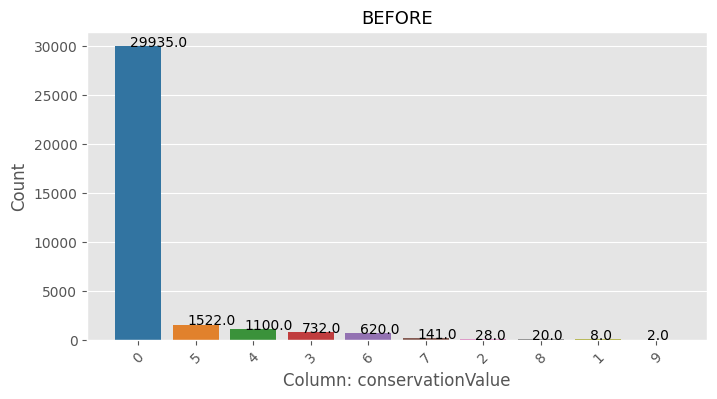

In [33]:
listemedto = ['energy_label_classification', 'conservationValue']
for i in range(len(listemedto)):
    nameColumn = listemedto[i]
    plt.figure(figsize=(8,4))
    #sns.histplot(df_input[nameColumn])
    ax = sns.countplot(df[nameColumn], order = df[nameColumn].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
    plt.xlabel('Column: ' + nameColumn, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title('BEFORE', fontsize=13)

    for p in ax.patches:
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.
    plt.autoscale()
    plt.xticks(rotation = 45)
    #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/BEFORE' + str((i+1)) +'.png', bbox_inches='tight')
    #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/BEFORE' + str((i+1)) +'.png', bbox_inches='tight')
    None #don't show the label objects

In [34]:
two_to_one = [['noiseLvl', '70-75 dB', 'over 75 dB', 'over 70 dB'], ['burglaryRisk', 'høj', 'meget høj', 'høj'], ['radonRisk', 'høj', 'meget høj', 'høj'], ['bathroomType', 'Hverken badeværelse eller adgang til badeværelse', 'Adgang til badeværelse', 'Ej badeværelse i enheden']]

multiple_to_one = [['outWallMaterialType', 'Mursten;Betonelementer;Andet materiale', 'Andet materiale'], ['roofType', 'Tegl;Fibercement herunder asbest;Tagpap med stor hældning;Andet materiale', 'Andet materiale'], ['heating_code', 'Fjernvarme/blokvarme;Andet', 'Andet'], ['heating_code_additional', '(UDFASES) Bygningen har ingen supplerende varme;Ovne til fast eller flydende brændsel;Andet', 'Andet'], ['energy_label_classification', 'a;a1;a2;a2010;a2015;a2020;b;c;d;e;f;g', 'A;B;C;D;E;F;G'],['conservationValue', [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] , ['Ingen bevaringsværdi', 'Lav bevaringsværdi', 'Middel bevaringsværdi', 'Høj bevaringsværdi']]]






In [35]:
def overwrite(df_input, twoToOne, multipleToOne):

    for i in range(len(twoToOne)): #We replace two to one
        df_input[twoToOne[i][0]].replace(twoToOne[i][1:3], twoToOne[i][3], inplace=True)

    for j in range(len(multipleToOne)): #We replace for the multiple to one.

        if multipleToOne[j][0] == 'conservationValue':
            val1 = multipleToOne[j][1][0]
            val2 = multipleToOne[j][1][1:4]
            val3 = multipleToOne[j][1][4:7]
            val4 = multipleToOne[j][1][7:10]
            val = [val1, val2, val3, val4]

            df_input[multipleToOne[j][0]].replace(val, multipleToOne[j][2], inplace=True)
        
        elif multipleToOne[j][0] != 'energy_label_classification':
            text = multipleToOne[j][1].split(';')
            replace_list = list(set(list(df_input[multipleToOne[j][0]].drop_duplicates())) - set(text))

            df_input[multipleToOne[j][0]].replace(replace_list, multipleToOne[j][2], inplace=True)

        else:

            text = multipleToOne[j][1].split(';')
            text2 = multipleToOne[j][2].split(';')
            replace_list = text[0:6]
            replace_list2 = text[6:len(text)]

            df_input[multipleToOne[j][0]].replace(replace_list, text2[0], inplace=True)
            df_input[multipleToOne[j][0]].replace(replace_list2,text2[1:len(text2)], inplace=True)

    return df_input


In [36]:
df = overwrite(df, two_to_one, multiple_to_one)

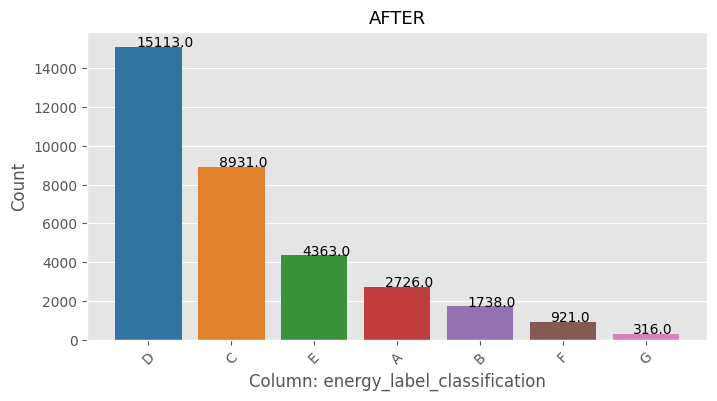

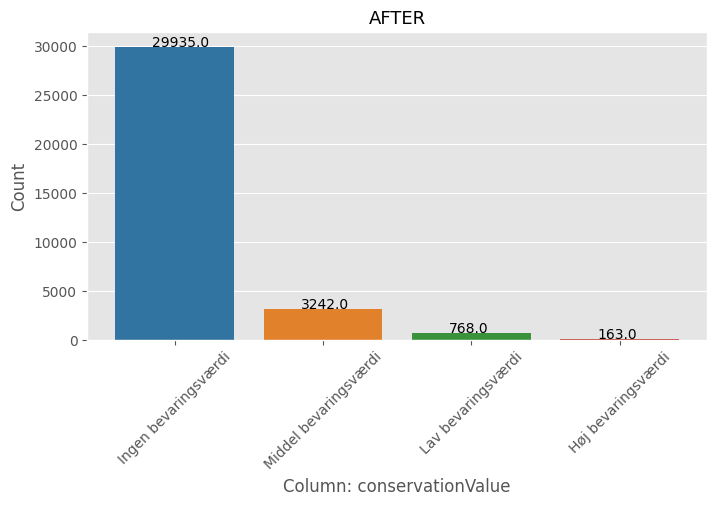

In [37]:
listemedto = ['energy_label_classification', 'conservationValue']
for i in range(len(listemedto)):
    nameColumn = listemedto[i]
    plt.figure(figsize=(8,4))
    #sns.histplot(df_input[nameColumn])
    ax = sns.countplot(df[nameColumn], order = df[nameColumn].value_counts().index) #We create our histplot, and order it by the highest to the lowest count.
    plt.xlabel('Column: ' + nameColumn, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title('AFTER', fontsize=13)

    for p in ax.patches:
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.
    plt.autoscale()
    plt.xticks(rotation = 45)
    #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/AFTER' + str((i+1)) +'.png', bbox_inches='tight')
    #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/AFTER' + str((i+1)) +'.png', bbox_inches='tight')
    None #don't show the label objects

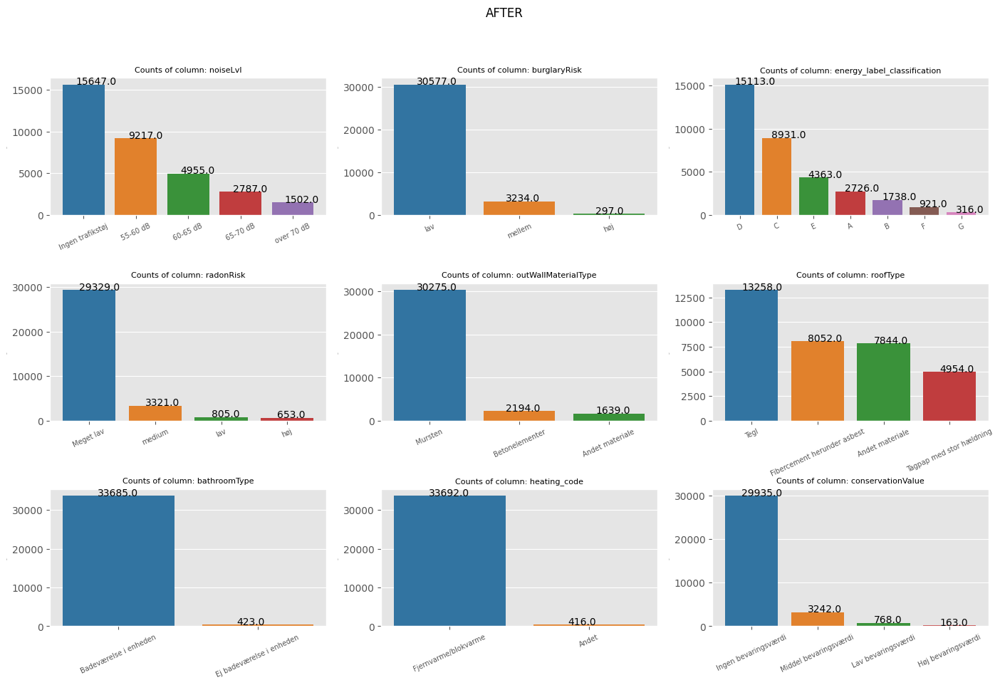

In [38]:
plot_Combine(3, 3, combine_list, 'AFTER')

In [39]:
df.loc[(df['heating_code_additional'] != '(UDFASES) Bygningen har ingen supplerende varme')]

,type,energy_law_applies,energy_label_classification,presale,year_built,year_renovated,sold_price,saleDate,saleYear,num_floors,floors_in_building,num_rooms,num_toilets,num_bathrooms,living_area,basement_area,weighted_area,built_in_outhouse_area,carport_area,garage_outhouse_free_area,conservatory_area,built_in_garage,lot,usageType,bathroomType,roofType,outWallMaterialType,heating_code,heating_code_additional,cityName,municipality,addressFloor,m2Price_WA,Water_view,Balcony,Opp_for_balcony,Rooftop_Terrace,Terrace,House_Animals,wgs84_lat,wgs84_lon,school,roadtrain,junction,daycare,metro,doctor,soccerfield,hospital,stop,lake,supermarket,pharmacy,strain,airport,train,library,publicbath,coast,sportshall,forest,radonRisk,noiseLvl,floodRisk,MAS,burglaryRisk,conservationValue,biggestParty,voterTurnout,short_rate,long_rate,OMXC_25,Consumer_price_index,ForcedSalesOfPropertyInRegionHovedstaden,unemployedRate,Population,AnnualisedAgreedRate,ElPrice_incl_moms_4000kWh,BenzinPrice_incl_moms,DieselPrice_incl_moms,AVM_price,latest_prop_valuation,Year_Week,Year_Months,Year_Quarter,addressName,addressNumber,addressDoor,address_id
3,condo,0,A,0,2017,NaN,2995000.0,2017-06-28,2017,1,9,2,1,1,85.0,0.0,85.0,0.0,0.0,0.0,0.0,0,1,"Etagebolig-bygning, flerfamiliehus eller tofam...",Badeværelse i enheden,Andet materiale,Betonelementer,Fjernvarme/blokvarme,Andet,København S,København,7,35235.294118,0,1,0,0,0,0,55.623884,12.575723,459.83,552.35,769.09,66.17,617.59,1389.55,1350.94,5504.86,578.62,5343.71,504.88,983.31,5388.19,5862.75,673.20,1085.08,2236.70,3068.04,3541.69,823.16,Meget lav,55-60 dB,er lav risiko,2.3,lav,Ingen bevaringsværdi,venstre,81.5,-0.53571,2.37995,1150.0,101.3,31,4.9,602481,2.133,233.324048,11.590000,9.710000,5495688.0,1850000.0,2017W26,2017M06,2017Q2,Robert Jacobsens Vej,1A,th,19e3705b-4b09-4d51-a78d-8d36c585cbfa
22,villa,1,D,0,1938,NaN,5300000.0,2017-02-25,2017,1,1,5,2,2,156.0,96.0,210.0,0.0,0.0,39.0,0.0,0,1,Fritliggende enfamilieshus (parcelhus),Badeværelse i enheden,Tegl,Mursten,Fjernvarme/blokvarme,Ovne til fast eller flydende brændsel,Vanløse,København,0,25238.095238,0,0,0,0,1,1,55.694417,12.487877,560.42,2871.65,3132.59,223.77,998.01,435.92,1471.85,3025.71,227.87,1859.48,581.30,1080.44,915.51,14328.37,4463.05,1020.62,1901.06,6596.41,1355.32,4003.61,medium,Ingen trafikstøj,kan være risiko,18.0,lav,Middel bevaringsværdi,socialdemokratiet,87.7,-0.40797,2.45222,1050.0,100.3,37,5.0,601448,2.008,244.498750,11.708571,10.152857,9055063.0,4650000.0,2017W08,2017M02,2017Q1,Højstrupvej,20,NaN,0a3f509e-e126-32b8-e044-0003ba298018
23,condo,1,A,0,2018,NaN,3798000.0,2020-07-01,2020,1,15,3,1,1,97.0,0.0,97.0,0.0,0.0,0.0,0.0,0,0,"Etagebolig-bygning, flerfamiliehus eller tofam...",Badeværelse i enheden,Andet materiale,Mursten,Fjernvarme/blokvarme,Andet,Valby,København,0,39154.639175,0,1,0,0,1,0,55.654476,12.507263,975.41,5225.96,1209.14,166.44,3671.84,944.21,1530.10,2789.67,202.89,3028.08,336.62,1615.60,959.40,11233.12,959.40,941.06,1353.77,2248.56,1314.74,3314.80,Meget lav,Ingen trafikstøj,kan være risiko,6.6,lav,Ingen bevaringsværdi,socialdemokratiet,79.3,-0.38970,1.15920,1348.0,103.2,15,6.5,633449,1.498,213.532674,11.677500,9.477500,4569986.0,2050000.0,2020W27,2020M07,2020Q3,Paradisæblevej,76,tv,55db0f58-ff3d-409f-9c26-c2bd5a6b0629
24,condo,0,A,1,2017,NaN,3525000.0,2018-02-04,2018,1,15,3,1,1,97.0,0.0,97.0,0.0,0.0,0.0,0.0,0,0,"Etagebolig-bygning, flerfamiliehus eller tofam...",Badeværelse i enheden,Andet materiale,Mursten,Fjernvarme/blokvarme,Andet,Valby,København,0,36340.206186,0,0,0,0,1,0,55.654476,12.507263,975.41,5225.96,1209.14,166.44,3671.84,944.21,1530.10,2789.67,202.89,3028.08,336.62,1615.60,959.40,11233.12,959.40,941.06,1353.77,2248.56,1314.74,3314.80,Meget lav,Ingen trafikstøj,kan være risiko,6.6,lav,Ingen bevaringsværdi,socialdemokratiet,79.3,-0.52304,2.04840,1137.0,101.0,33,4.7,611822,1.867,216.149742,11.910000,10.340000,4569986.0,2050000.0,2018W05,2018M02,2018Q1,Paradisæblevej,76,tv,55db0f58-ff3d-409f-9c26-c2bd5a6b0629
25,villa,1,C,0,1936

* ### Look at descriptions and garage/outhouse/carport

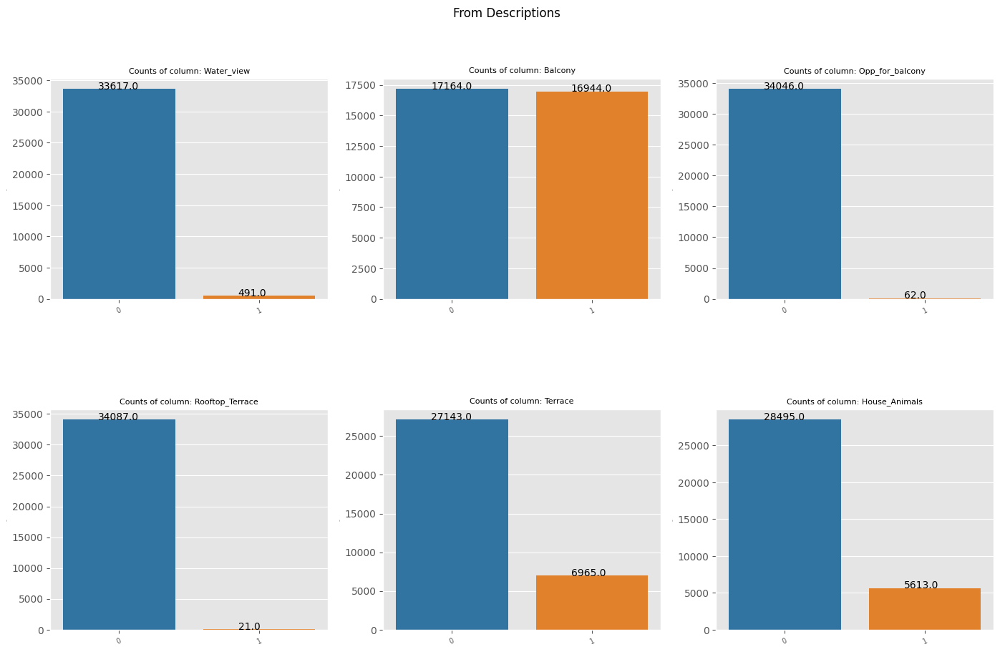

In [40]:
plot_Combine(2, 3, ['Water_view', 'Balcony', 'Opp_for_balcony', 'Rooftop_Terrace', 'Terrace', 'House_Animals'], 'From Descriptions')

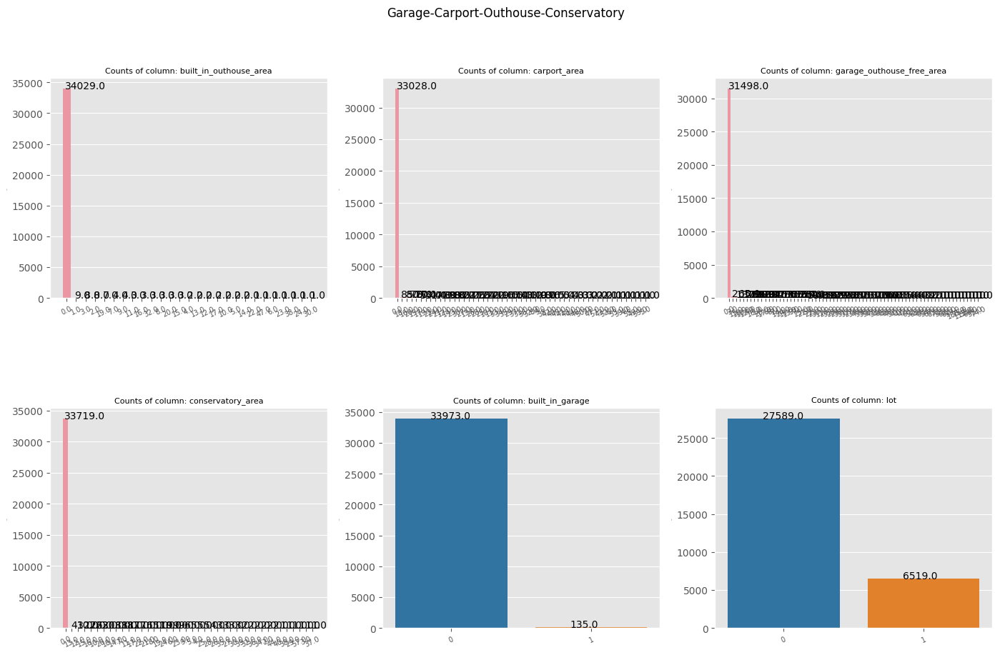

In [41]:
plot_Combine(2, 3, ['built_in_outhouse_area', 'carport_area', 'garage_outhouse_free_area', 'conservatory_area', 'built_in_garage', 'lot'], 'Garage-Carport-Outhouse-Conservatory')

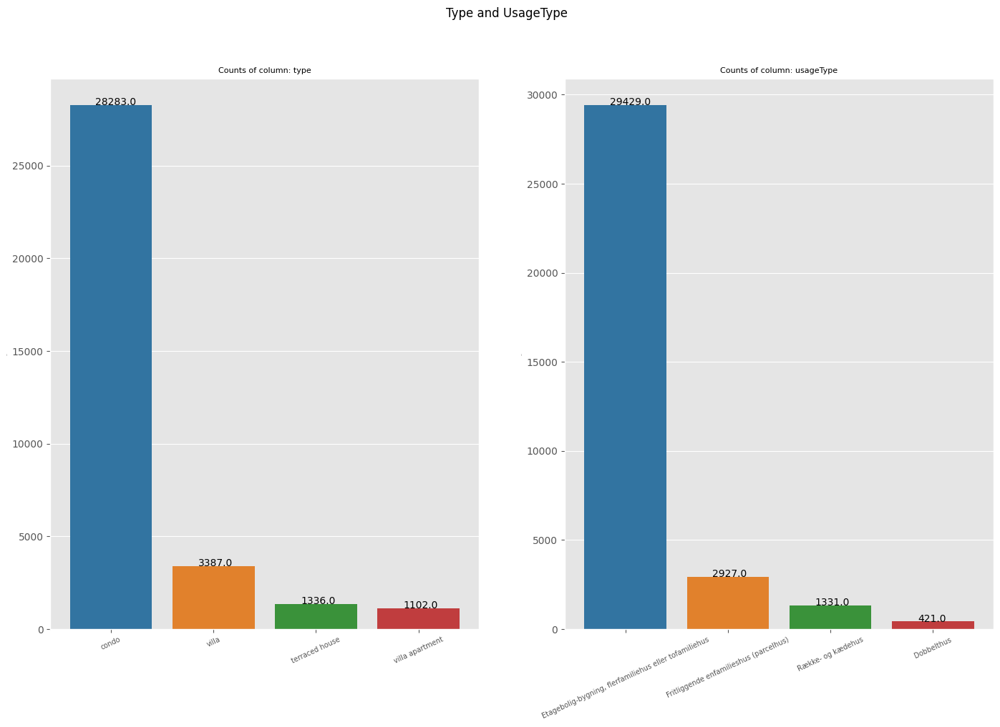

In [42]:
plot_Combine(1, 2, ['type', 'usageType'], 'Type and UsageType')

In [43]:

Counter(df.loc[df['type']=='condo']['usageType'])#.loc[(df['usageType']=='Dobbelthus')])


Counter({'Etagebolig-bygning, flerfamiliehus eller tofamiliehus': 28225,
         'Dobbelthus': 5,
         'Række- og kædehus': 39,
         'Fritliggende enfamilieshus (parcelhus)': 14})

In [44]:
Counter(df.loc[df['type']=='villa']['usageType'])

Counter({'Dobbelthus': 302,
         'Fritliggende enfamilieshus (parcelhus)': 2904,
         'Etagebolig-bygning, flerfamiliehus eller tofamiliehus': 60,
         'Række- og kædehus': 121})

In [45]:
Counter(df.loc[df['type']=='terraced house']['usageType'])

Counter({'Række- og kædehus': 1169,
         'Etagebolig-bygning, flerfamiliehus eller tofamiliehus': 51,
         'Dobbelthus': 111,
         'Fritliggende enfamilieshus (parcelhus)': 5})

In [46]:
Counter(df.loc[df['type']=='villa apartment']['usageType'])

Counter({'Etagebolig-bygning, flerfamiliehus eller tofamiliehus': 1093,
         'Dobbelthus': 3,
         'Række- og kædehus': 2,
         'Fritliggende enfamilieshus (parcelhus)': 4})

* ##  Number of sales of the same real estat in the periode 2017-2022

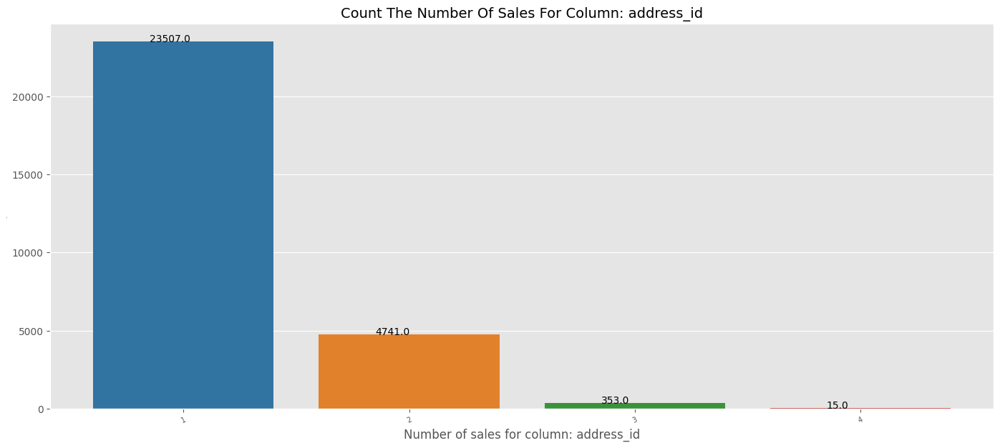

In [47]:
dup = df.groupby('address_id', as_index=False, dropna=False).size() #We look for duplicates in column: 'address_id' and add a new column: size, which we can tell how many time it is mentioned.

plt.figure(figsize=(17,7))
ax = sns.countplot(dup['size']) #We create our histplot, and order it by the highest to the lowest count.
ax.set_xticklabels(ax.get_xticklabels(), fontsize=7, rotation = 25)
for p in ax.patches:
            ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) #Here we get the counted number on top of our histplot.

plt.xlabel('Number of sales for column: address_id')
plt.ylabel('Count', fontsize=0.5)
plt.title('Count The Number Of Sales For Column: address_id' , fontsize=14)
plt.autoscale()


#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Sales For Column address_id.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Sales For Column address_id.png', bbox_inches='tight')

In [48]:
print(23506+2*4741+3*354+4*15)
len(df) #Its a match

34110


34108

In [49]:
df[['addressName','addressNumber', 'addressFloor', 'addressDoor']].value_counts()


addressName               addressNumber  addressFloor  addressDoor
Mågevej                   44             1             th             28
                                         0             tv             28
Brønshøjvej               63             2             th             22
Ørholmgade                4              3             th             22
Brønshøjvej               63             0             tv             22
                                                                      ..
Kronprinsesse Sofies Vej  17             1             th              1
                                         0             tv              1
Kronprinsensvej           4A             2             tv              1
                                         1             tv              1
Kongelundsvej             67A            1             tv              1
Length: 13872, dtype: int64

In [50]:
#We can below see that if we look at the four variables of addrres, then we get a different view of sales. 
#But I have looked into this in the raw data, and it appeares that the address number is not correct quiet often, which give the leed for so many duplicates.
#I went in and looke at the column: gstkvhx_kommunekode_vejkode_husnr_x, and compared it with the four columns as below, and could here see that 'husnr' was not the same as 'addressNumber'. 
#Wich also then make sence that they do not have the 'address_id'.
# 
# So we trust the 'address_id'. Also we don't want to use the addressNumber for our models. 

#I looked at: 
#addressName               addressNumber  addressFloor  addressDoor   Count
#Mågevej                   44             1             th             28

df[['addressName','addressNumber', 'addressFloor', 'addressDoor']].value_counts().to_frame().value_counts().sort_index()


1     7593
2     3473
3     1361
4      645
5      321
6      182
7       94
8       79
9       44
10      22
11      10
12      15
13       8
14       4
15       4
16       3
17       1
18       2
19       2
20       2
21       2
22       3
28       2
dtype: int64

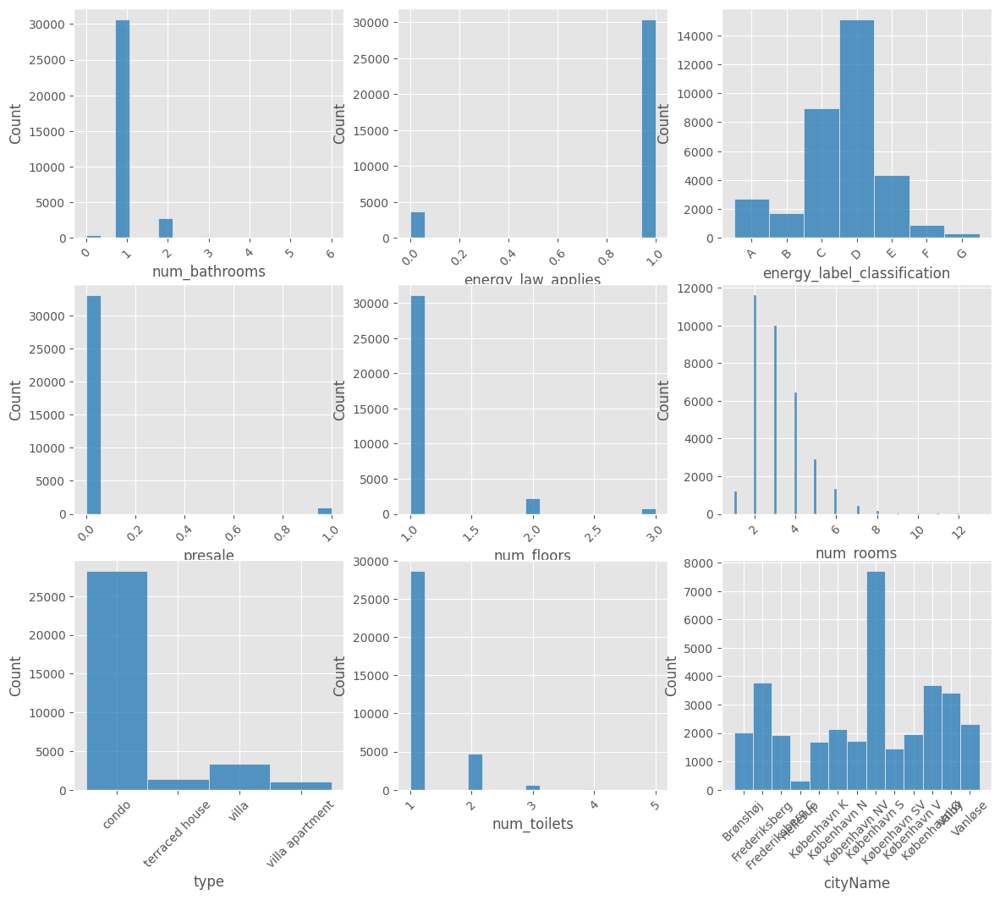

In [51]:
plotName = 'ForskelligePlots_Cleaned'

plt.figure(figsize=(14, 12))
plt.subplot(3, 3, 1)
sns.histplot(df['num_bathrooms'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 2)
sns.histplot(df['energy_law_applies'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 3)
sns.histplot(df['energy_label_classification'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 4)
sns.histplot(df['presale'].astype(int))
plt.xticks(rotation = 45)
plt.subplot(3, 3, 5)
sns.histplot(df['num_floors'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 6)
sns.histplot(df['num_rooms'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 7)
sns.histplot(df['type'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 8)
sns.histplot(df['num_toilets'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 9)
sns.histplot(df['cityName'])
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/' + plotName + '.png', bbox_inches='tight')
plt.xticks(rotation = 45)
None

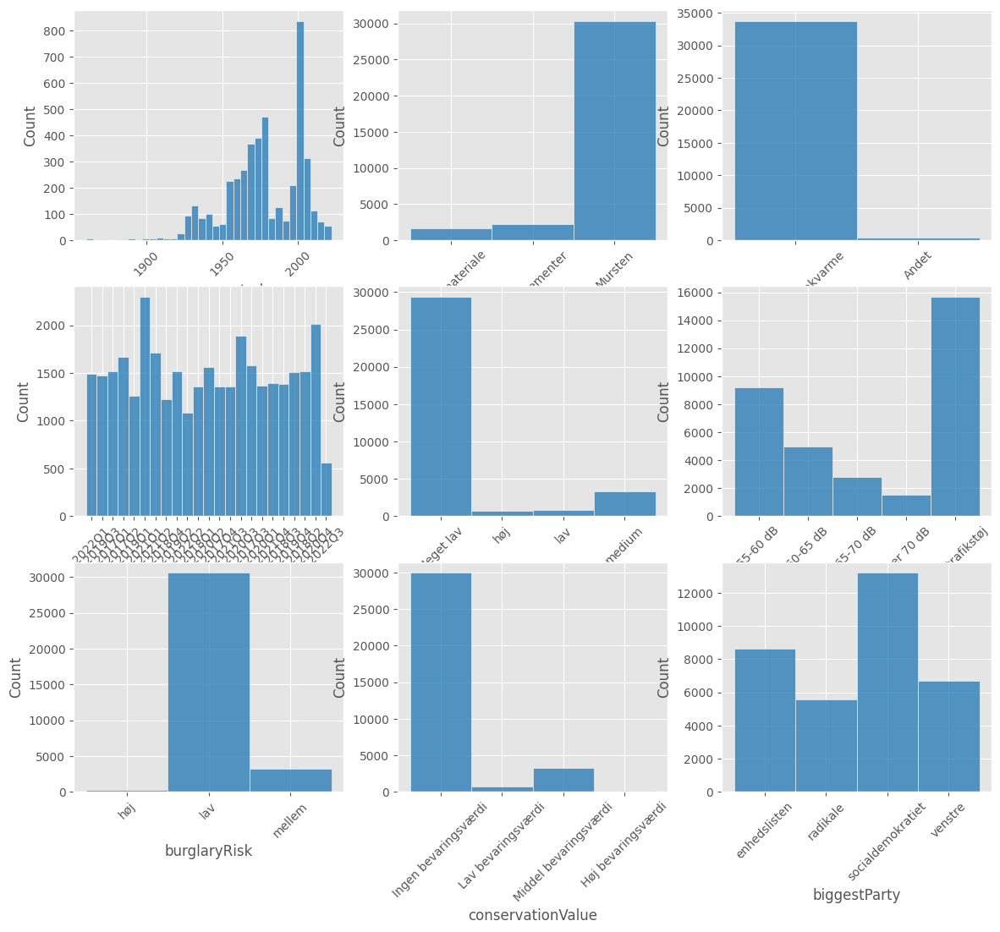

In [52]:
plotName = 'ForskelligePlots_Cleaned2'
plt.figure(figsize=(14, 12))
plt.subplot(3, 3, 1)
sns.histplot(df['year_renovated'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 2)
sns.histplot(df['outWallMaterialType'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 3)
sns.histplot(df['heating_code'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 4)
sns.histplot(df['Year_Quarter'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 5)
sns.histplot(df['radonRisk'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 6)
sns.histplot(df['noiseLvl'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 7)
sns.histplot(df['burglaryRisk'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 8)
sns.histplot(df['conservationValue'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 9)
sns.histplot(df['biggestParty'])
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/' + plotName + '.png', bbox_inches='tight')
plt.xticks(rotation = 45)
None

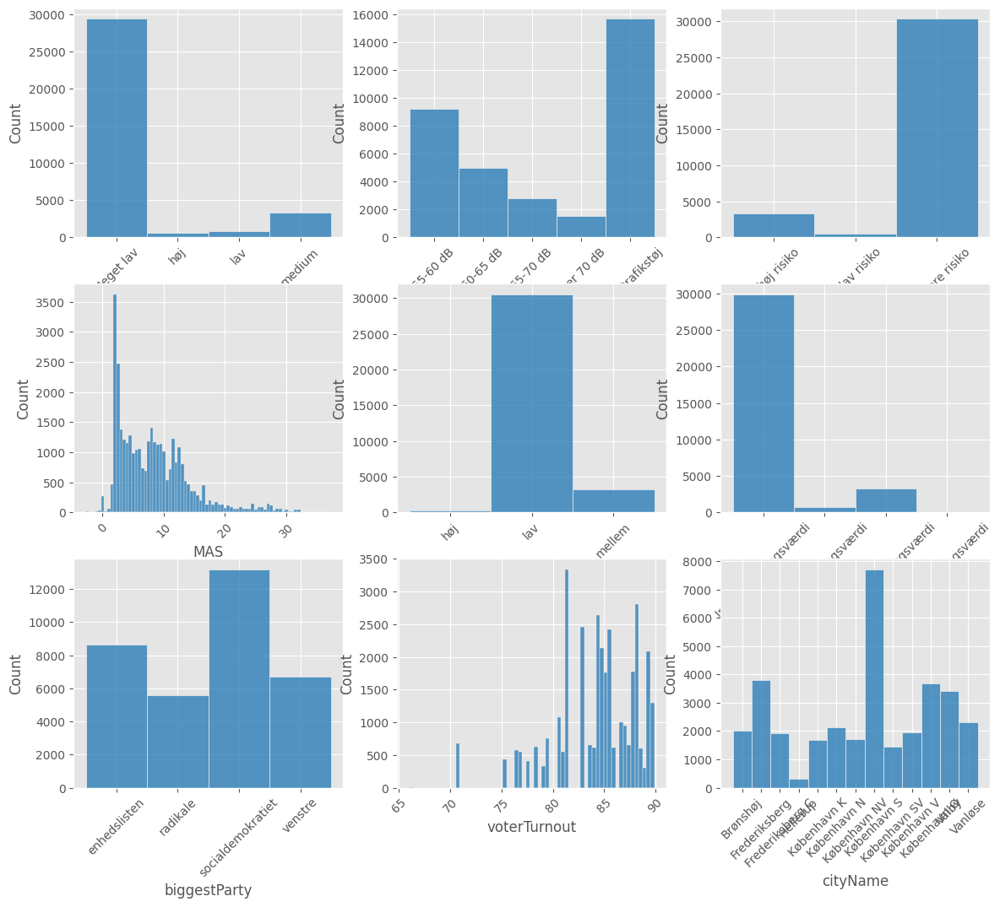

In [53]:
plotName = 'ForskelligePlots_Cleaned4'
plt.figure(figsize=(14, 12))
plt.subplot(3, 3, 1)
sns.histplot(df['radonRisk'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 2)
sns.histplot(df['noiseLvl'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 3)
sns.histplot(df['floodRisk'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 4)
sns.histplot(df['MAS'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 5)
sns.histplot(df['burglaryRisk'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 6)
sns.histplot(df['conservationValue'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 7)
sns.histplot(df['biggestParty'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 8)
sns.histplot(df['voterTurnout'])
plt.xticks(rotation = 45)
plt.subplot(3, 3, 9)
sns.histplot(df['cityName'])
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/' + plotName + '.png', bbox_inches='tight')
plt.xticks(rotation = 45)
None

In [54]:
df.loc[(df['wgs84_lon'] < 12.4509 )] # We check for wrong longtitude and latitude. (And correct them, by find the address on google maps, and get the coordinates.)

,type,energy_law_applies,energy_label_classification,presale,year_built,year_renovated,sold_price,saleDate,saleYear,num_floors,floors_in_building,num_rooms,num_toilets,num_bathrooms,living_area,basement_area,weighted_area,built_in_outhouse_area,carport_area,garage_outhouse_free_area,conservatory_area,built_in_garage,lot,usageType,bathroomType,roofType,outWallMaterialType,heating_code,heating_code_additional,cityName,municipality,addressFloor,m2Price_WA,Water_view,Balcony,Opp_for_balcony,Rooftop_Terrace,Terrace,House_Animals,wgs84_lat,wgs84_lon,school,roadtrain,junction,daycare,metro,doctor,soccerfield,hospital,stop,lake,supermarket,pharmacy,strain,airport,train,library,publicbath,coast,sportshall,forest,radonRisk,noiseLvl,floodRisk,MAS,burglaryRisk,conservationValue,biggestParty,voterTurnout,short_rate,long_rate,OMXC_25,Consumer_price_index,ForcedSalesOfPropertyInRegionHovedstaden,unemployedRate,Population,AnnualisedAgreedRate,ElPrice_incl_moms_4000kWh,BenzinPrice_incl_moms,DieselPrice_incl_moms,AVM_price,latest_prop_valuation,Year_Week,Year_Months,Year_Quarter,addressName,addressNumber,addressDoor,address_id
5949,condo,1,E,0,1912,NaN,2825000.0,2017-11-23,2017,1,5,3,1,1,66.0,0.0,66.0,0.0,0.0,0.0,0.0,0,0,"Etagebolig-bygning, flerfamiliehus eller tofam...",Badeværelse i enheden,Tegl,Mursten,Fjernvarme/blokvarme,(UDFASES) Bygningen har ingen supplerende varme,Valby,København,3,42803.030303,0,1,0,0,0,0,55.663636,12.292079,249.09,5030.97,2820.95,243.77,2140.26,377.07,1520.96,3246.17,129.41,1805.38,183.24,155.81,606.72,11006.83,606.72,803.57,1461.77,2490.83,1617.94,4435.11,Meget lav,65-70 dB,kan være risiko,12.6,lav,Ingen bevaringsværdi,socialdemokratiet,80.7,-0.80057,2.14786,1196.0,101.9,37,4.9,605366,1.715,231.325219,11.656667,10.106667,3740383.0,1200000.0,2017W47,2017M11,2017Q4,Vigerslev Allé,21,th,0a3f50a1-4285-32b8-e044-0003ba298018
33603,condo,1,C,0,1978,NaN,3725000.0,2022-08-15,2022,1,2,2,1,1,69.0,0.0,69.0,0.0,0.0,0.0,0.0,0,0,"Etagebolig-bygning, flerfamiliehus eller tofam...",Badeværelse i enheden,Tagpap med stor hældning,Mursten,Fjernvarme/blokvarme,(UDFASES) Bygningen har ingen supplerende varme,Hellerup,København,0,53985.507246,0,0,0,0,1,0,56.000001,9.000001,790.56,5485.37,1747.59,252.99,2097.53,742.90,688.21,2355.17,109.17,1729.50,398.56,780.39,746.67,13565.78,746.67,1523.93,2498.23,632.74,1467.63,2490.33,Meget lav,Ingen trafikstøj,kan være risiko,6.3,mellem,Ingen bevaringsværdi,venstre,85.5,-0.34079,4.14779,1771.0,114.9,9,3.4,646812,3.294,390.051375,17.747143,16.918571,3629822.0,1400000.0,2022W33,2022M08,2022Q3,Tuborgvej,17,4,0a3f50a1-4748-32b8-e044-0003ba298018


In [55]:
#We correct the coordinates and begin to plot.
df.loc[5949, 'wgs84_lon'] = 12.519309998332567
df.loc[5949, 'wgs84_lat'] = 55.66119351632339

df.loc[33605, 'wgs84_lon'] = 12.57271733695044
df.loc[33605, 'wgs84_lat'] = 55.72622930896577



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


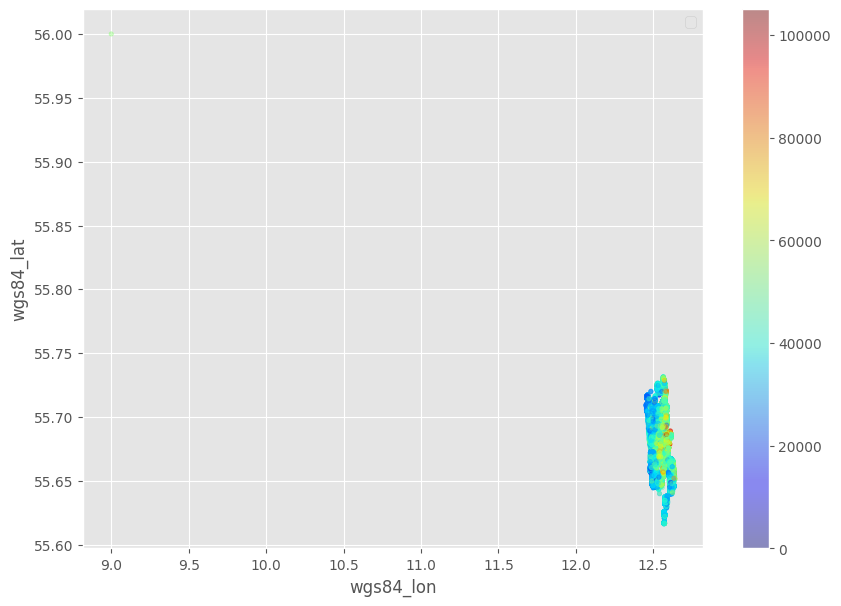

In [56]:
# The circle represents population and color represents prices.

df.plot(kind="scatter", x="wgs84_lon", y="wgs84_lat", alpha=0.4,
            figsize=(10,7), s = 10, vmin = 0, vmax = 105000,
            c = df["m2Price_WA"], cmap=plt.get_cmap("jet"), colorbar=True, sharex=False)
# plt.xticks(rotation = 90)

plt.legend()



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


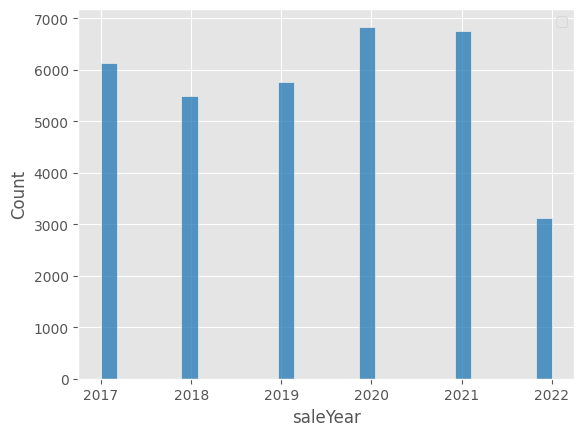

In [57]:
sns.histplot(df['saleYear'])
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/sold_count_year.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/sold_count_year.png', bbox_inches='tight')
plt.legend()

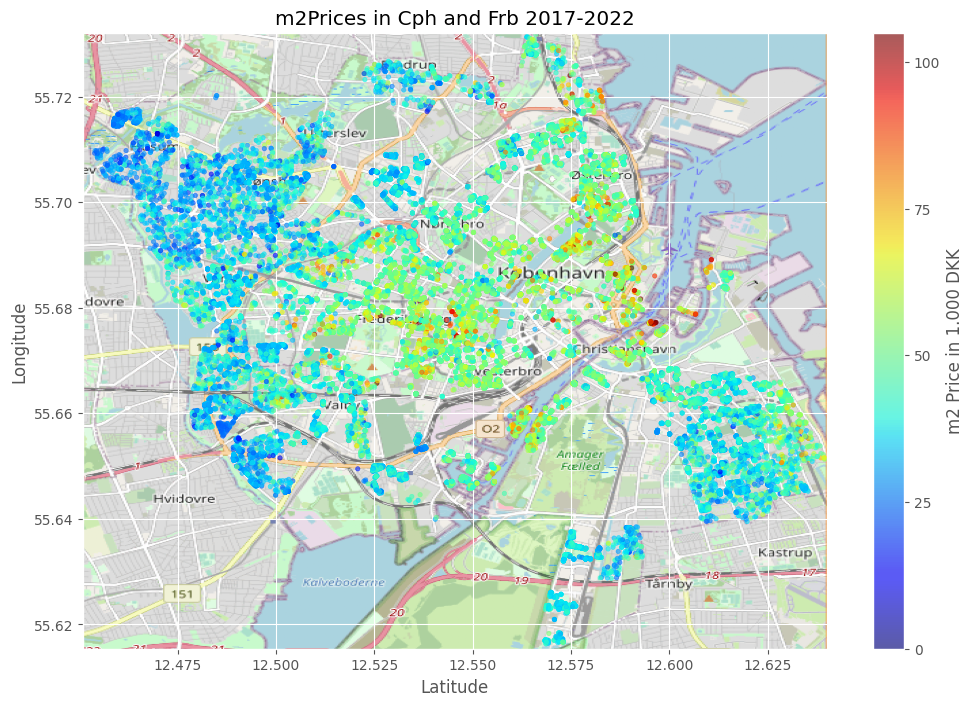

In [58]:
BBox = ((12.4509, 12.6401, 55.6154, 55.7321))

background_map = plt.imread('MapFromFolium.png') 

### m2 price

plt.rcParams["figure.figsize"] = (12,8)

fig, ax = plt.subplots()
cbar = fig.colorbar(ax.scatter(df['wgs84_lon'], df['wgs84_lat'],
           zorder=1, alpha= 0.6, c=df['m2Price_WA']/1000, cmap = plt.get_cmap('jet'), s=10,
                               vmin = 0, vmax = 105),
                    ticks = [0, 25, 50, 75, 100])
cbar.ax.set_ylabel('m2 Price in 1.000 DKK', fontsize = 12)
ax.set_title('m2Prices in Cph and Frb 2017-2022')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(background_map, zorder=0, extent = BBox, aspect = 'auto')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/m2Prices in Cph and Frb 17-22.png', bbox_inches='tight')
plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/m2Prices in Cph and Frb 17-22.png', bbox_inches='tight')

plt.show()

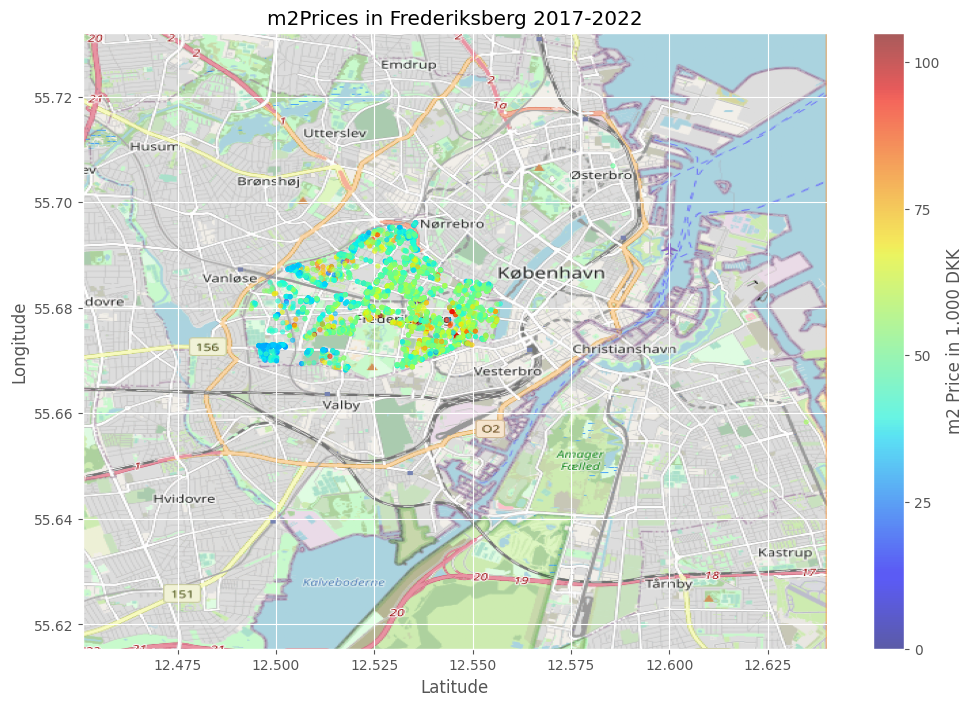

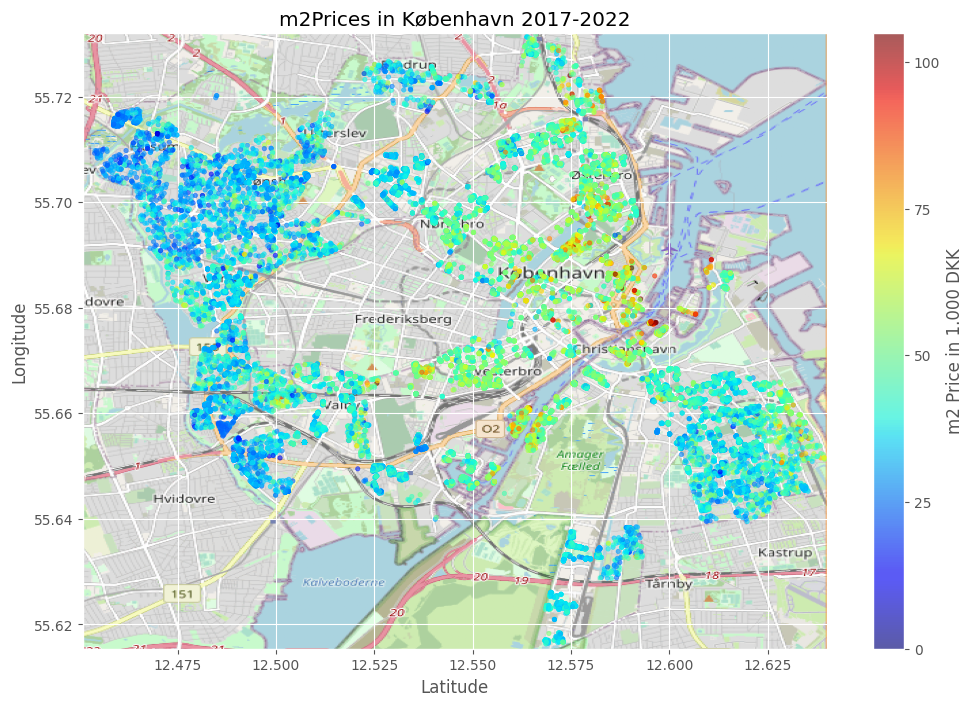

In [59]:

name = ['Frederiksberg', 'København']

for i in range(len(name)):

    BBox = ((12.4509, 12.6401, 55.6154, 55.7321))

    background_map = plt.imread('MapFromFolium.png') 

    ### m2 price

    plt.rcParams["figure.figsize"] = (12,8)

    fig, ax = plt.subplots()
    cbar = fig.colorbar(ax.scatter(df.loc[df['municipality']==name[i]]['wgs84_lon'], df.loc[df['municipality']==name[i]]['wgs84_lat'],
            zorder=1, alpha= 0.6, c=df.loc[df['municipality']==name[i]]['m2Price_WA']/1000, cmap = plt.get_cmap('jet'), s=10,
                                vmin = 0, vmax = 105),
                        ticks = [0, 25, 50, 75, 100])
    cbar.ax.set_ylabel('m2 Price in 1.000 DKK', fontsize = 12)
    ax.set_title('m2Prices in ' + name[i] + ' 2017-2022')
    ax.set_xlim(BBox[0],BBox[1])
    ax.set_ylim(BBox[2],BBox[3])
    ax.imshow(background_map, zorder=0, extent = BBox, aspect = 'auto')
    plt.xlabel('Latitude')
    plt.ylabel('Longitude')
    plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/m2Prices in ' + name[i]  + ' 17-22.png', bbox_inches='tight')
    plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/m2Prices in ' + name[i]  + ' 17-22.png', bbox_inches='tight')

    plt.show()

Use folium package to get our map.

In [64]:
m = folium.Map(max_zoom=21, control_scale=True)
bounds = [ [BBox[2], BBox[0]] , [BBox[3], BBox[1]] ]
folium.Rectangle(bounds=bounds, color='#ff7800').add_to(m)
m.fit_bounds(bounds)
#I manually clip out the picture with a screen dump and choose the orange square I have made
m

In [61]:
def plot_2mPrice_year(df_input, df_aar):
    df = df_input
    BBox = ((12.4509, 12.6401, 55.6154, 55.7321))
    background_map = plt.imread('MapFromFolium.png') 
    
    for i in range(len(df_aar)): #And we print for each saleYear
        
        aar = df_aar.loc[i, 'saleYear']

        ### m2 price for each year
        plt.rcParams["figure.figsize"] = (12,8)
        
        fig, ax = plt.subplots()
        cbar = fig.colorbar(ax.scatter(df[df['saleYear']==aar]['wgs84_lon'], df[df['saleYear']==aar]['wgs84_lat'],
                zorder=1, alpha= 0.6, c=(df[df['saleYear']==aar]['m2Price_WA'])/1000, cmap = plt.get_cmap('jet'), s=10,
                                    vmin = 0, vmax = 105),
                            ticks = [0, 25, 50, 75, 100])
        
        cbar.ax.set_ylabel('m2 Price in 1.000 DKK', fontsize = 12)
        ax.set_title('Square meter Prices in Cph. and Frb. in ' + str(aar))
        ax.set_xlim(BBox[0],BBox[1])
        ax.set_ylim(BBox[2],BBox[3])
        ax.imshow(background_map, zorder=0, extent = BBox, aspect = 'auto')
        plt.xlabel('Latitude')
        plt.ylabel('Longitude')
        
        
        plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/m2Prices in Cph and Frb ' + str(aar) + '.png', bbox_inches='tight')
        plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/m2Prices in Cph and Frb ' + str(aar) + '.png', bbox_inches='tight')
        plt.show()
    return
       


In [62]:

df_aar = pd.DataFrame(list(df['saleYear'].drop_duplicates().sort_values()), columns=['saleYear'])


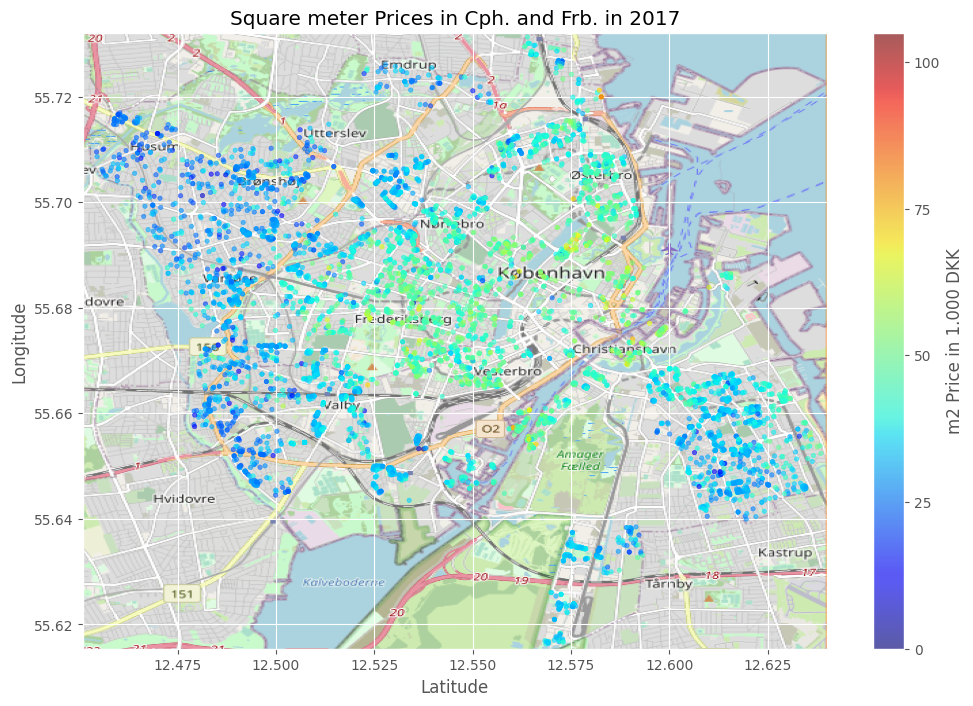

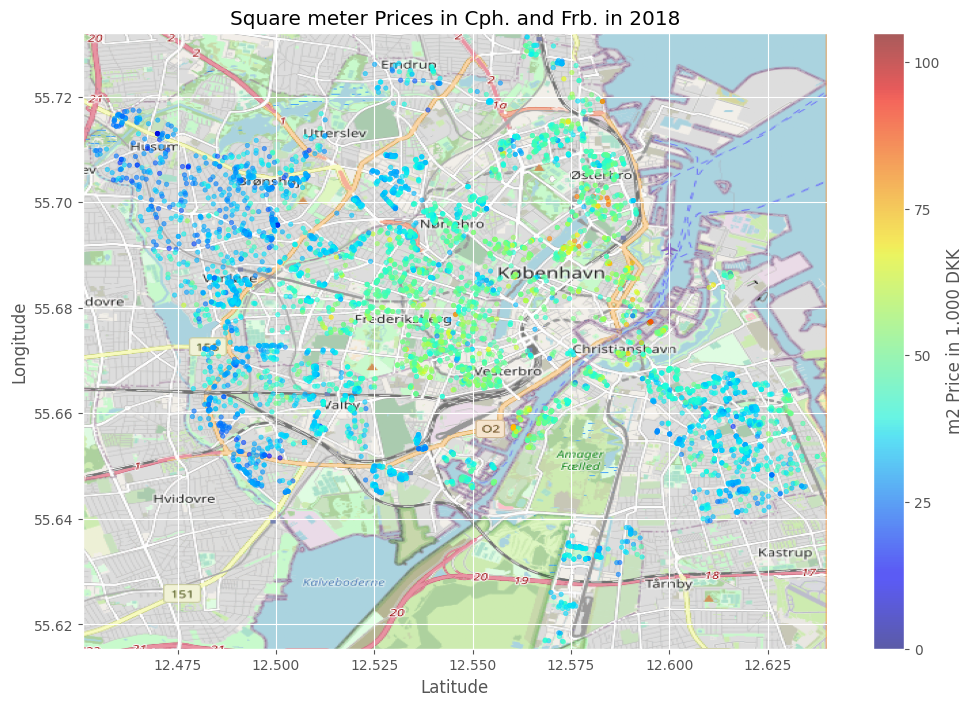

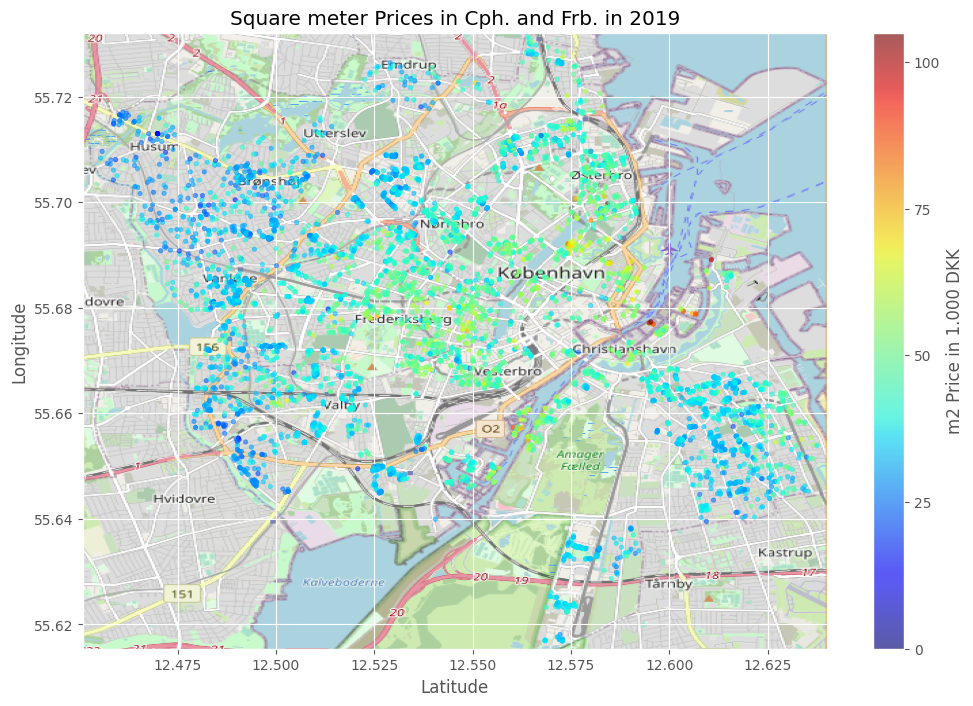

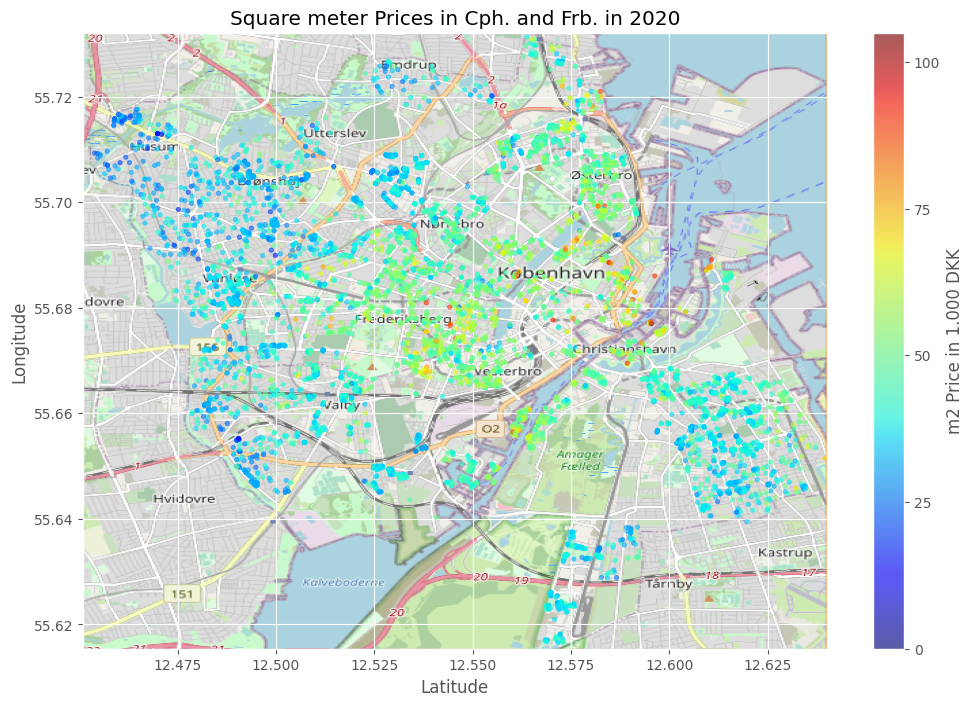

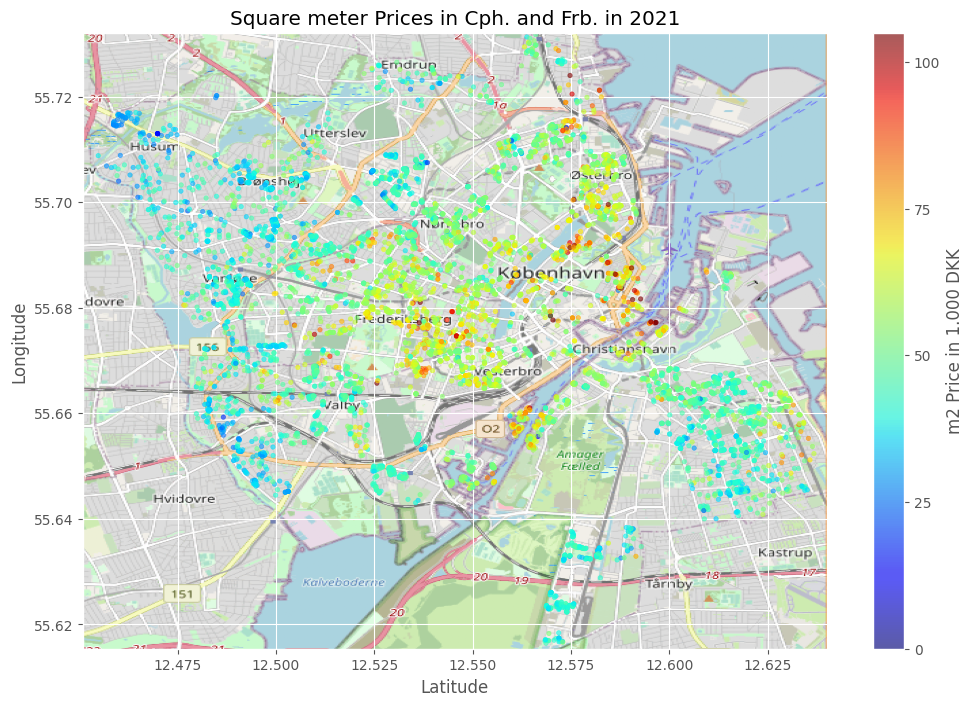

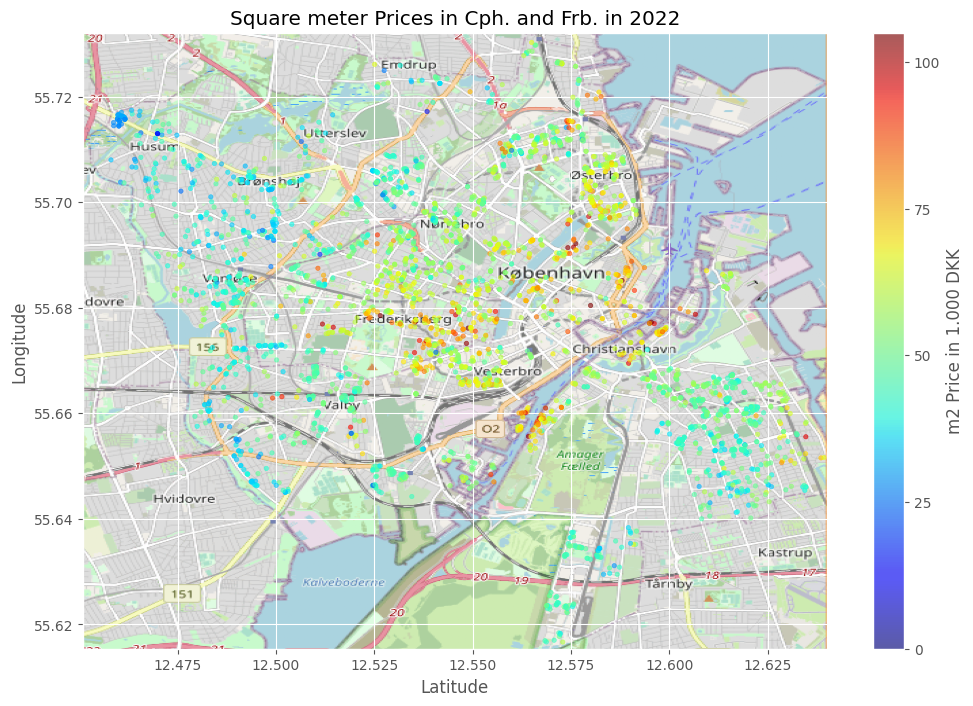

In [63]:
plot_2mPrice_year(df, df_aar)

skew: 3.006615010742843
kurt: 23.709739268995712
mean: 4111136.3641667645
median: 3510000.0


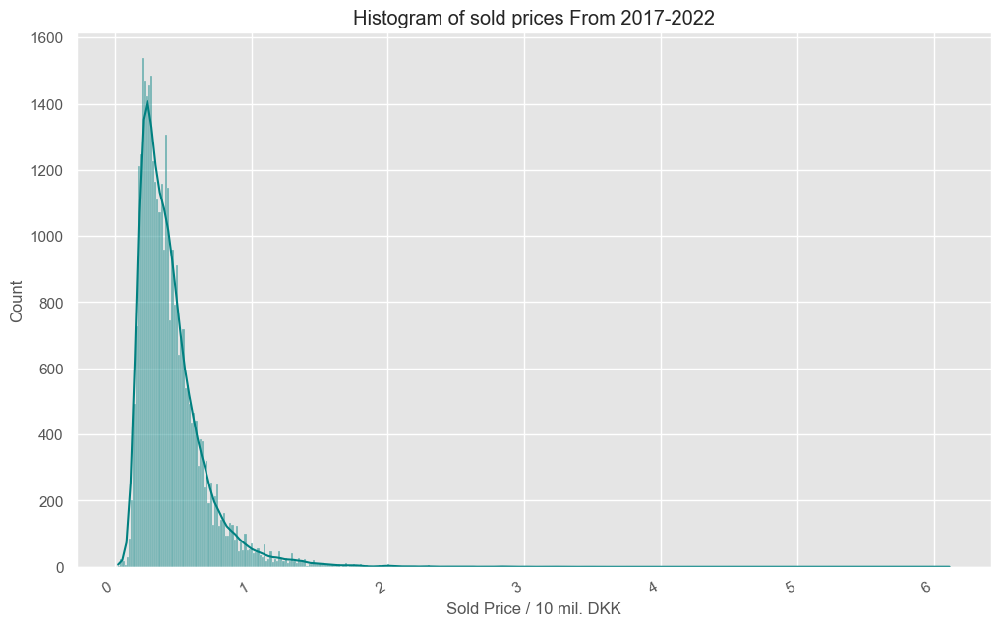

In [332]:
############################
####### HISTOGRAM ##########
############################


print('skew: ' + str(df['sold_price'].skew()))
print('kurt: ' + str(df['sold_price'].kurt()))
print('mean: ' + str(df['sold_price'].mean()))
print('median: ' + str(df['sold_price'].median()))
# We see how the response is distributed, right skewed with a heavy right tail above 62 mil..
# This can also be seen on skewness and kurtosis (which are both positive)




fig, ax = plt.subplots()

sns.histplot(x=((df['sold_price'])/(1e7)), kde=True, color = ['teal'])


fig.autofmt_xdate()
plt.xlabel('Sold Price / 10 mil. DKK')
plt.title('Histogram of sold prices From 2017-2022')
plt.rc('axes', labelsize=20)
xticks = ax.xaxis.get_major_ticks()

#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Histogram of sold prices From 2017-2022.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Histogram of sold prices From 2017-2022.png', bbox_inches='tight')
plt.show()

skew: 0.9184534842371761
kurt: 2.091575935691691
mean: 43982.02343690078
median: 42453.68782161235


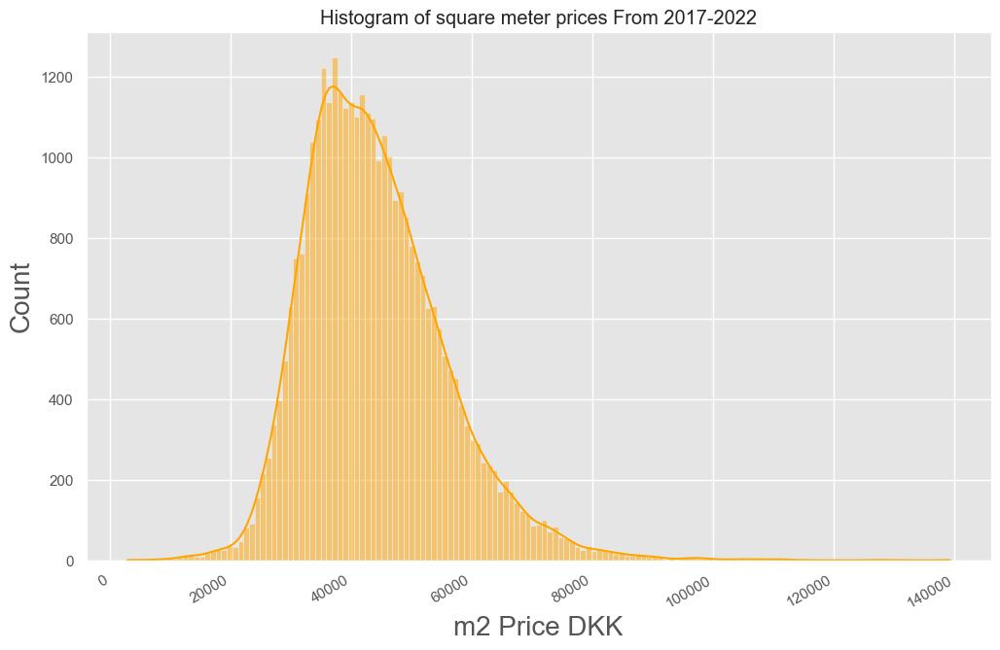

In [333]:


print('skew: ' + str(df['m2Price_WA'].skew()))
print('kurt: ' + str(df['m2Price_WA'].kurt()))
print('mean: ' + str(df['m2Price_WA'].mean()))
print('median: ' + str(df['m2Price_WA'].median()))





fig, ax = plt.subplots()

sns.histplot(x=df['m2Price_WA'], kde=True, color = ['orange'])


fig.autofmt_xdate()
plt.xlabel('m2 Price DKK')
plt.title('Histogram of square meter prices From 2017-2022')
plt.rc('axes', labelsize=20)
xticks = ax.xaxis.get_major_ticks()

#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Histogram of m2 prices From 2017-2022.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Histogram of m2 prices From 2017-2022.png', bbox_inches='tight')
plt.show()

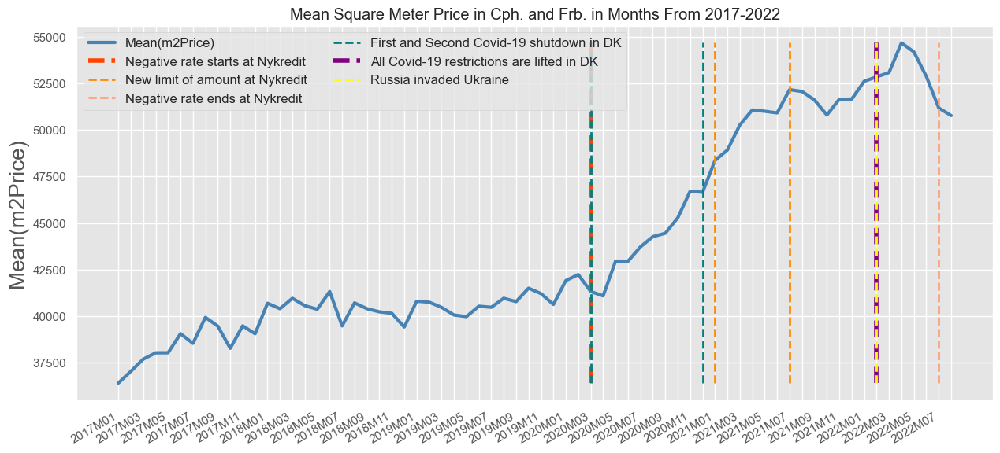

In [334]:
### MEAN SQUARE METER PRICE

ChooseDate = 'Year_Months'

m2price = df.groupby(ChooseDate)['m2Price_WA'].mean()
plt.rcParams["figure.figsize"] = (15,7)
fig, ax = plt.subplots()

plt.plot(m2price, c ='steelblue', linewidth=3, label='Mean(m2Price)')


min = (m2price.min() - 5 )
maks = (m2price.max() + 5)
if ChooseDate == 'Year_Quarter' :
    plt.vlines(x=['2020Q1', '2020Q4'], ymin=[min, min], ymax=[maks,maks], colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=2, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')
if ChooseDate == 'Year_Months' :
    plt.vlines(x=['2020M03'], ymin=[min], ymax=[maks] , colors='orangered', ls='--', lw=4, label='Negative rate starts at Nykredit')
    plt.vlines(x=['2021M01', '2021M07'], ymin=[min], ymax=[maks] , colors='darkorange', ls='--', lw=2, label='New limit of amount at Nykredit')
    plt.vlines(x=['2022M07'], ymin=[min], ymax=[maks] , colors='lightsalmon', ls='--', lw=2, label='Negative rate ends at Nykredit')
    plt.vlines(x=['2020M03', '2020M12'], ymin=[min,min], ymax=[maks, maks] , colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=4, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')







fig.autofmt_xdate()
plt.ylabel('Mean(m2Price)')
plt.title('Mean Square Meter Price in Cph. and Frb. in Months From 2017-2022')
plt.rc('axes', labelsize=20)
plt.legend(fontsize=12, ncol=2)
xticks = ax.xaxis.get_major_ticks()
for i,tick in enumerate(xticks):
    if i%2 != 0:
        tick.label1.set_visible(False)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/mean(m2Price) in Months 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/mean(m2Price) in Months 17-22.png', bbox_inches='tight')
plt.show()

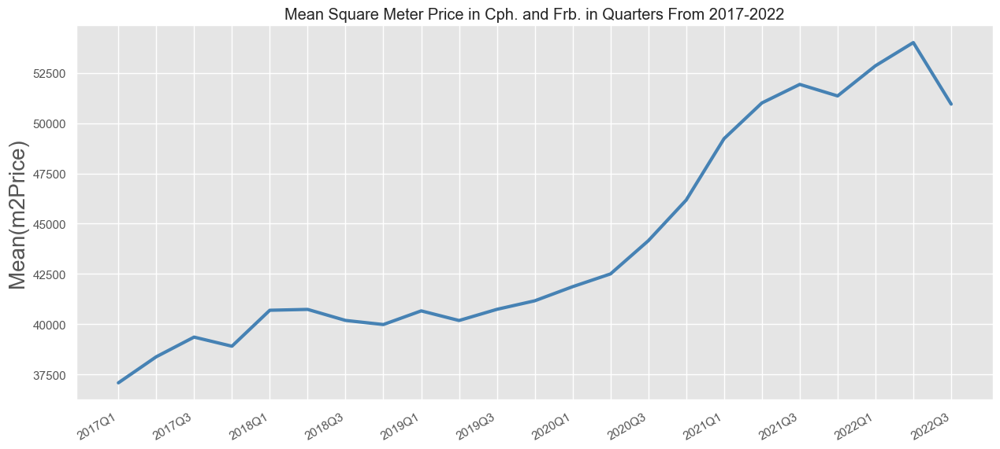

In [335]:
### SQUARE METER PRICE
m2price = df.groupby('Year_Quarter')['m2Price_WA'].mean()
plt.rcParams["figure.figsize"] = (15,7)
fig, ax = plt.subplots()

plt.plot(m2price, c ='steelblue', linewidth=3)


fig.autofmt_xdate()
plt.ylabel('Mean(m2Price)')
plt.title('Mean Square Meter Price in Cph. and Frb. in Quarters From 2017-2022')
plt.rc('axes', labelsize=20)
xticks = ax.xaxis.get_major_ticks()
for i,tick in enumerate(xticks):
    if i%2 != 0:
        tick.label1.set_visible(False)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/mean(m2Price) in Quarters 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/mean(m2Price) in Quarters 17-22.png', bbox_inches='tight')
plt.show()

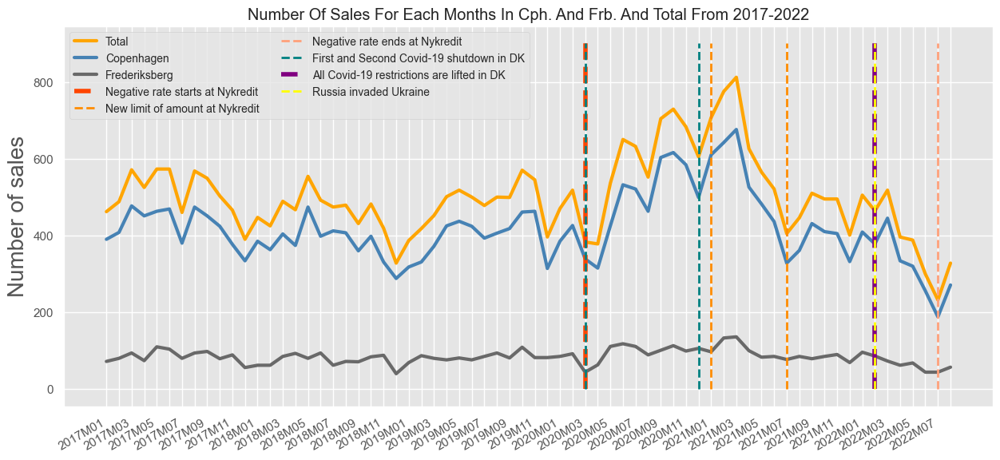

In [336]:
### NUMBER OF SALES

df['count'] = 1

#ChooseDate = 'Year_Quarter'
ChooseDate = 'Year_Months'


NumberOfSales = df.groupby([ChooseDate])['count'].sum()
NumberOfSalesFrederiksberg = df.loc[df['municipality'] == 'Frederiksberg'].groupby([ChooseDate])['count'].sum()
NumberOfSalesKoebenhavn = df.loc[~(df['municipality'] == 'Frederiksberg')].groupby([ChooseDate])['count'].sum()


plt.rcParams["figure.figsize"] = (15,7)
fig, ax = plt.subplots()

plt.plot(NumberOfSales, c ='orange', linewidth=3, label = 'Total')
plt.plot(NumberOfSalesKoebenhavn, c ='steelblue', linewidth=3, label = 'Copenhagen')
plt.plot(NumberOfSalesFrederiksberg, c ='dimgrey', linewidth=3, label = 'Frederiksberg')

fig.autofmt_xdate()


if ChooseDate == 'Year_Quarter' :
    plt.vlines(x=['2020Q1', '2020Q4'], ymin=[0,0], ymax=[3000, 3000], colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022Q1'], ymin=[0], ymax=[3000] , colors='purple', ls='--', lw=2, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022Q1'], ymin=[0], ymax=[3000] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')
if ChooseDate == 'Year_Months' :
    ymini = 0
    ymaxi = 900

    plt.vlines(x=['2020M03'], ymin=[ymini], ymax=[ymaxi]  , colors='orangered', ls='--', lw=4, label='Negative rate starts at Nykredit')
    plt.vlines(x=['2021M01', '2021M07'], ymin=[ymini,ymini], ymax=[ymaxi, ymaxi] , colors='darkorange', ls='--', lw=2, label='New limit of amount at Nykredit')
    plt.vlines(x=['2022M07'], ymin=[ymini], ymax=[ymaxi]  , colors='lightsalmon', ls='--', lw=2, label='Negative rate ends at Nykredit')
    plt.vlines(x=['2020M03', '2020M12'], ymin=[ymini,ymini], ymax=[ymaxi, ymaxi] , colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022M02'], ymin=[ymini], ymax=[ymaxi] , colors='purple', ls='--', lw=4, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022M02'], ymin=[ymini], ymax=[ymaxi] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')







plt.ylabel('Number of sales')
plt.title('Number Of Sales For Each ' + ChooseDate.partition('_')[2] + ' In Cph. And Frb. And Total From 2017-2022')
plt.rc('axes', labelsize=20)
plt.legend(fontsize=10, ncol=2, loc='upper left')
xticks = ax.xaxis.get_major_ticks()
for i,tick in enumerate(xticks):
    if i%2 != 0:
        tick.label1.set_visible(False)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Number Of Sales in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Number Of Sales in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
plt.show()

df.drop(columns='count', inplace=True) #We drop our column count, we created in the start of this cell. 

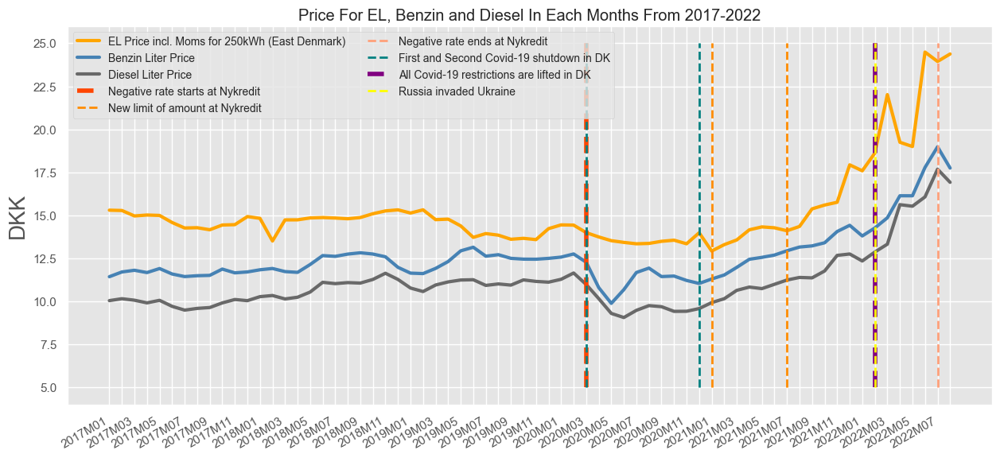

In [337]:
###Price For EL, Benzin and Diesel



#ChooseDate = 'Year_Quarter'
ChooseDate = 'Year_Months'


EL_price_250kWH = df.groupby([ChooseDate])['ElPrice_incl_moms_4000kWh'].mean()/16
Benzin_price = df.groupby([ChooseDate])['BenzinPrice_incl_moms'].mean()
Diesel_price = df.groupby([ChooseDate])['DieselPrice_incl_moms'].mean()



plt.rcParams["figure.figsize"] = (15,7)
fig, ax = plt.subplots()

plt.plot(EL_price_250kWH, c ='orange', linewidth=3, label = 'EL Price incl. Moms for 250kWh (East Denmark)')
plt.plot(Benzin_price, c ='steelblue', linewidth=3, label = 'Benzin Liter Price')
plt.plot(Diesel_price, c ='dimgrey', linewidth=3, label = 'Diesel Liter Price')




min = 5
maks = 25
if ChooseDate == 'Year_Quarter' :
    plt.vlines(x=['2020Q1', '2020Q4'], ymin=[min, min], ymax=[maks,maks], colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=2, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')
if ChooseDate == 'Year_Months' :
    plt.vlines(x=['2020M03'], ymin=[min], ymax=[maks] , colors='orangered', ls='--', lw=4, label='Negative rate starts at Nykredit')
    plt.vlines(x=['2021M01', '2021M07'], ymin=[min], ymax=[maks] , colors='darkorange', ls='--', lw=2, label='New limit of amount at Nykredit')
    plt.vlines(x=['2022M07'], ymin=[min], ymax=[maks] , colors='lightsalmon', ls='--', lw=2, label='Negative rate ends at Nykredit')
    plt.vlines(x=['2020M03', '2020M12'], ymin=[min,min], ymax=[maks, maks] , colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=4, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')






fig.autofmt_xdate()


plt.ylabel('DKK')
plt.title('Price For EL, Benzin and Diesel In Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
plt.rc('axes', labelsize=20)
plt.legend(fontsize=10, ncol=2, loc='upper left')
xticks = ax.xaxis.get_major_ticks()
for i,tick in enumerate(xticks):
    if i%2 != 0:
        tick.label1.set_visible(False)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Price For EL, Benzin and Diesel ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Price For EL, Benzin and Diesel ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
plt.show()


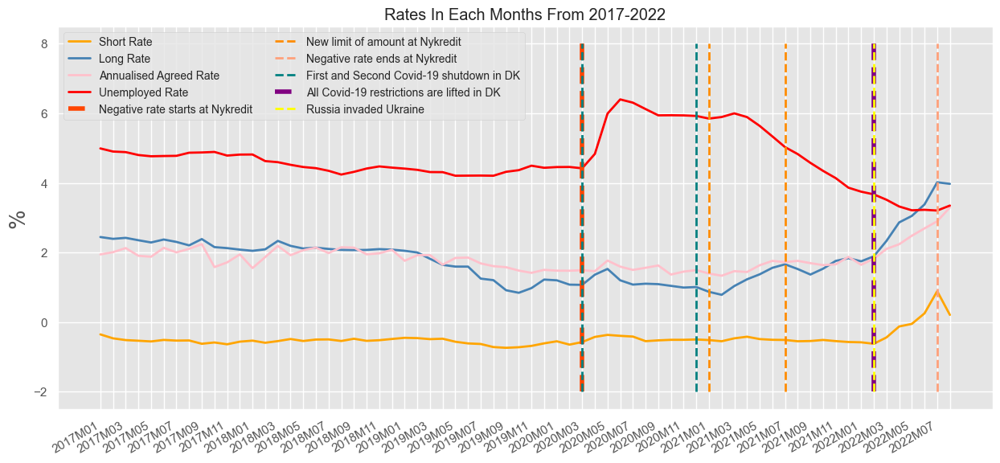

In [338]:
###Short and Long rate 




ChooseDate = 'Year_Months'


shortRate = df.groupby([ChooseDate])['short_rate'].mean()
longRate = df.groupby([ChooseDate])['long_rate'].mean()
AnAgRate = df.groupby([ChooseDate])['AnnualisedAgreedRate'].mean()
Unemployed = df.groupby([ChooseDate])['unemployedRate'].mean()



plt.rcParams["figure.figsize"] = (15,7)
fig, ax = plt.subplots()

plt.plot(shortRate, c ='orange', linewidth=2, label = 'Short Rate')
plt.plot(longRate, c ='steelblue', linewidth=2, label = 'Long Rate')
plt.plot(AnAgRate, c ='pink', linewidth=2, label = 'Annualised Agreed Rate')
plt.plot(Unemployed, c ='red', linewidth=2, label = 'Unemployed Rate')

min = round(shortRate.min(), 0) - 1
maks =  round(Unemployed.max(), 0) + 2
if ChooseDate == 'Year_Quarter' :
    plt.vlines(x=['2020Q1', '2020Q4'], ymin=[min, min], ymax=[maks,maks], colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=2, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')
if ChooseDate == 'Year_Months' :
    plt.vlines(x=['2020M03'], ymin=[min], ymax=[maks] , colors='orangered', ls='--', lw=4, label='Negative rate starts at Nykredit')
    plt.vlines(x=['2021M01', '2021M07'], ymin=[min], ymax=[maks] , colors='darkorange', ls='--', lw=2, label='New limit of amount at Nykredit')
    plt.vlines(x=['2022M07'], ymin=[min], ymax=[maks] , colors='lightsalmon', ls='--', lw=2, label='Negative rate ends at Nykredit')
    plt.vlines(x=['2020M03', '2020M12'], ymin=[min,min], ymax=[maks, maks] , colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=4, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')





fig.autofmt_xdate()

#plt.ylim(0, 45)
plt.ylabel('%')
plt.title('Rates In Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
plt.rc('axes', labelsize=20)
plt.legend(fontsize=10, ncol=2, loc='upper left')
xticks = ax.xaxis.get_major_ticks()
for i,tick in enumerate(xticks):
    if i%2 != 0:
        tick.label1.set_visible(False)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Rates in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Rates in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
plt.show()

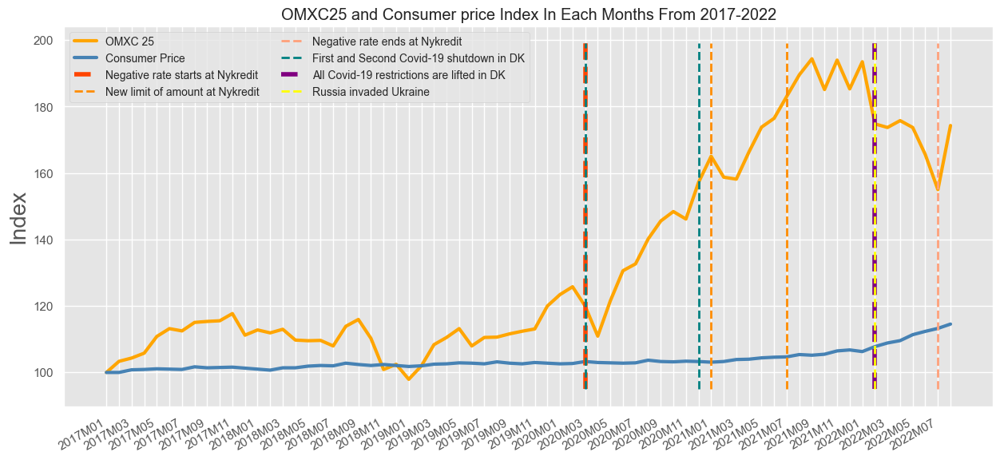

In [339]:
###Index OMXC25 and Consumer Price index. All start in 100.




ChooseDate = 'Year_Months'


omxc25 = df.groupby([ChooseDate])['OMXC_25'].mean()
conprice = df.groupby([ChooseDate])['Consumer_price_index'].mean()

#We make sure that they both starts in index 100
omxc25 = (omxc25/omxc25[0])*100
conprice = (conprice/conprice[0])*100


plt.rcParams["figure.figsize"] = (15,7) 
fig, ax = plt.subplots()

plt.plot(omxc25, c ='orange', linewidth=3, label = 'OMXC 25')
plt.plot(conprice, c ='steelblue', linewidth=3, label = 'Consumer Price')


min = round(conprice.min(), 0) - 5
maks = round(omxc25.max(), 0) + 5

if ChooseDate == 'Year_Quarter' :
    plt.vlines(x=['2020Q1', '2020Q4'], ymin=[min, min], ymax=[maks,maks], colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=2, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')
if ChooseDate == 'Year_Months' :
    plt.vlines(x=['2020M03'], ymin=[min], ymax=[maks] , colors='orangered', ls='--', lw=4, label='Negative rate starts at Nykredit')
    plt.vlines(x=['2021M01', '2021M07'], ymin=[min], ymax=[maks] , colors='darkorange', ls='--', lw=2, label='New limit of amount at Nykredit')
    plt.vlines(x=['2022M07'], ymin=[min], ymax=[maks] , colors='lightsalmon', ls='--', lw=2, label='Negative rate ends at Nykredit')
    plt.vlines(x=['2020M03', '2020M12'], ymin=[min,min], ymax=[maks, maks] , colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=4, label='All Covid-19 restrictions are lifted in DK')
    plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')






fig.autofmt_xdate()

#plt.ylim(0, 45)
plt.ylabel('Index')
plt.title('OMXC25 and Consumer price Index In Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
plt.rc('axes', labelsize=20)
plt.legend(fontsize=10, ncol=2, loc='upper left')
xticks = ax.xaxis.get_major_ticks()
for i,tick in enumerate(xticks):
    if i%2 != 0:
        tick.label1.set_visible(False)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/OMXC25 and Consumer price Index 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/OMXC25 and Consumer price Index 17-22.png', bbox_inches='tight')
plt.show()

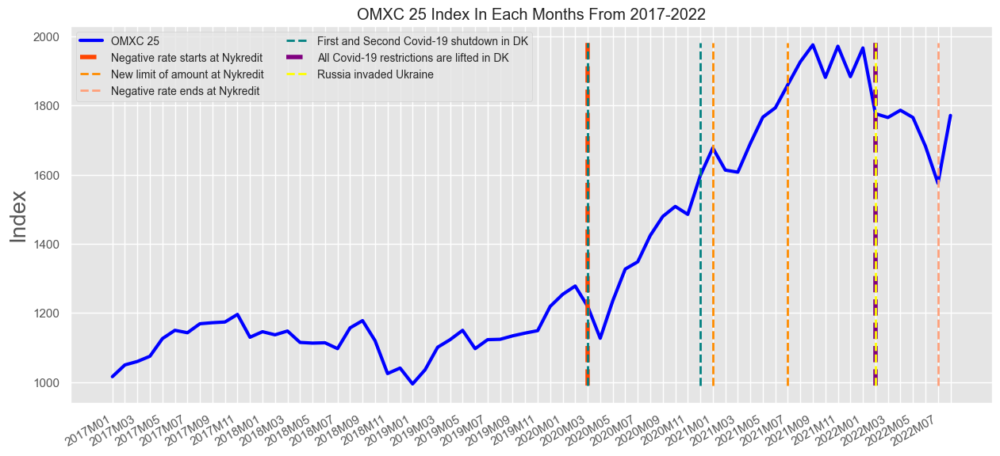

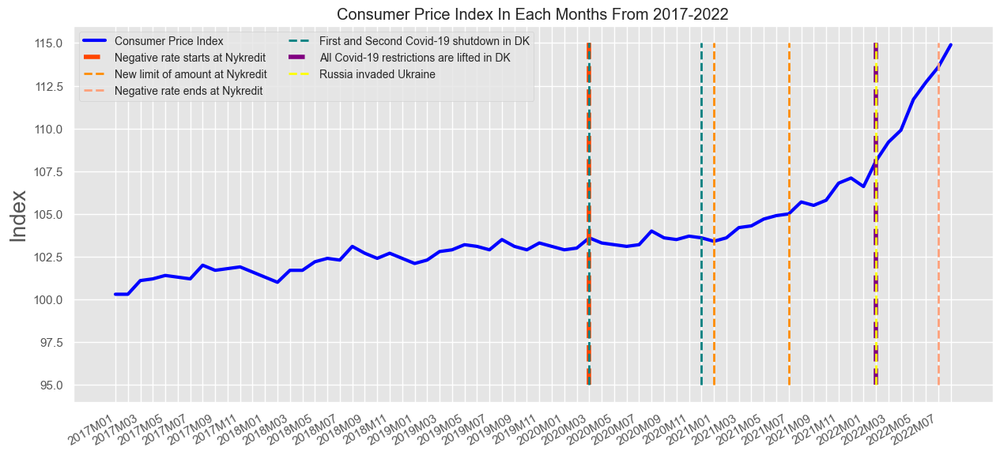

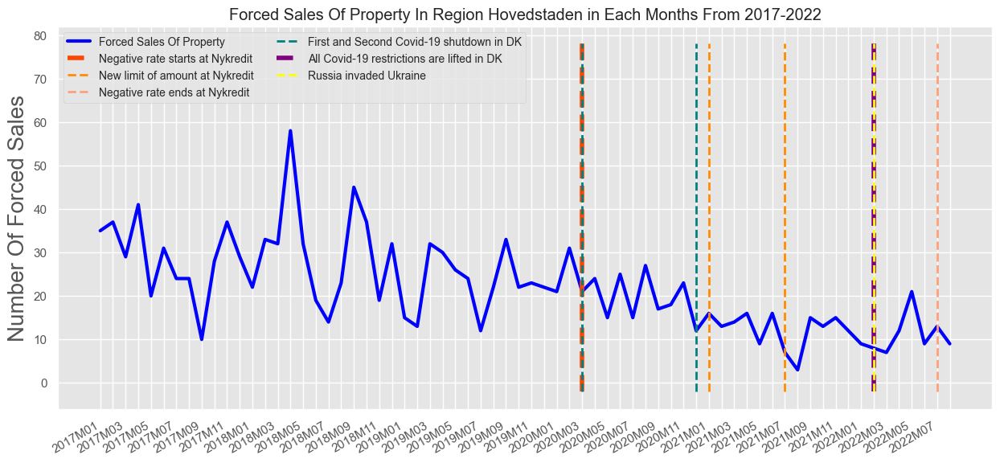

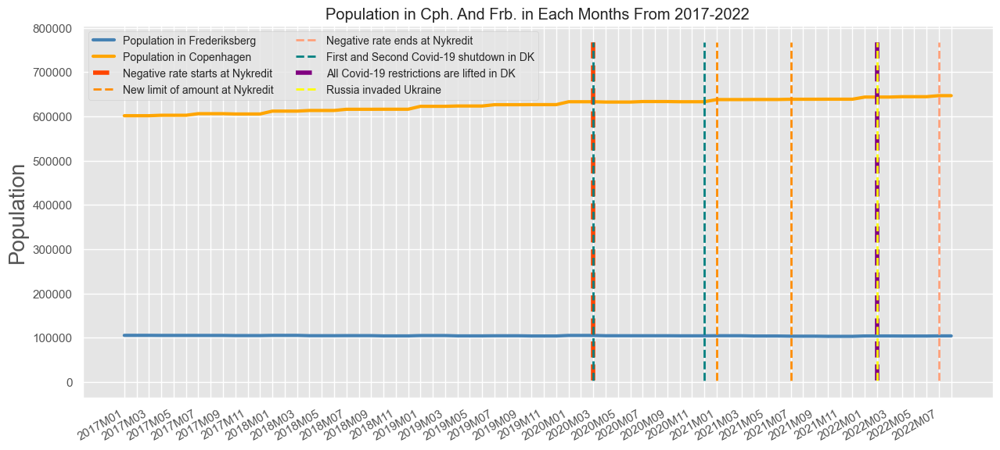

In [340]:


#ChooseDate = 'Year_Quarter'
ChooseDate = 'Year_Months'

Variable = ['OMXC_25', 'Consumer_price_index', 'ForcedSalesOfPropertyInRegionHovedstaden', 'Population']


for j in range(0, len(Variable)):
    model = df.groupby([ChooseDate])[Variable[j]].mean()





    plt.rcParams["figure.figsize"] = (15,7)
    fig, ax = plt.subplots()


    if (Variable[j] == 'OMXC_25'):
        min = round(model.min(), 0) - 5
        maks = round(model.max(), 0) + 5
        plt.plot(model, c ='blue', linewidth=3, label = 'OMXC 25')
        plt.title('OMXC 25 Index In Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
        plt.ylabel('Index')

    if (Variable[j] == 'Consumer_price_index'):
        min = round(model.min(), 0) - 5
        maks = round(model.max(), 0) 

        #JUST FOR FUN TO SEE THE PRICES AGAINST THE INDEX OF THE CONSUMER PRICE
        # We make sure that they both starts in index 100
        # EL_price_250kWH = (EL_price_250kWH/EL_price_250kWH[0])*100
        # Benzin_price = (Benzin_price/Benzin_price[0])*100
        # Diesel_price = (Diesel_price/Diesel_price[0])*100
        # conprice

        # plt.plot(EL_price_250kWH, c ='orange', linewidth=3, label = 'EL Price incl. Moms for 250kWh (East Denmark)')
        # plt.plot(Benzin_price, c ='steelblue', linewidth=3, label = 'Benzin Liter Price')
        # plt.plot(Diesel_price, c ='dimgrey', linewidth=3, label = 'Diesel Liter Price')

        # plt.plot(conprice, c ='blue', linewidth=3, label = 'Consumer Price Index')

        plt.plot(model, c ='blue', linewidth=3, label = 'Consumer Price Index')
        plt.title('Consumer Price Index In Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
        plt.ylabel('Index')

    if (Variable[j] == 'ForcedSalesOfPropertyInRegionHovedstaden'):
        plt.plot(model, c ='blue', linewidth=3, label = 'Forced Sales Of Property')
        plt.title('Forced Sales Of Property In Region Hovedstaden in Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
        min = round(model.min(), 0) - 5
        maks = round(model.max(), 0) + 20
        plt.ylabel('Number Of Forced Sales')



    if (Variable[j] == 'Population'):

        modelFrb = df.loc[(df['municipality'] == 'Frederiksberg')].groupby([ChooseDate])['Population'].mean()
        modelCph = df.loc[~(df['municipality'] == 'Frederiksberg')].groupby([ChooseDate])['Population'].mean()

        plt.plot(modelFrb, c ='steelblue', linewidth=3, label = 'Population in Frederiksberg')
        plt.plot(modelCph, c ='orange', linewidth=3, label = 'Population in Copenhagen')
        plt.title('Population in Cph. And Frb. in Each ' + ChooseDate.partition('_')[2] + ' From 2017-2022')
        plt.ylabel('Population')
        min = round(modelFrb.min(), 0) - 1e5
        maks = round(modelCph.max(), 0) + 1.2e5



    if ChooseDate == 'Year_Quarter' :
        plt.vlines(x=['2020Q1', '2020Q4'], ymin=[min, min], ymax=[maks,maks], colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
        plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=2, label='All Covid-19 restrictions are lifted in DK')
        plt.vlines(x=['2022Q1'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')
    if ChooseDate == 'Year_Months' :
        plt.vlines(x=['2020M03'], ymin=[min], ymax=[maks] , colors='orangered', ls='--', lw=4, label='Negative rate starts at Nykredit')
        plt.vlines(x=['2021M01', '2021M07'], ymin=[min], ymax=[maks] , colors='darkorange', ls='--', lw=2, label='New limit of amount at Nykredit')
        plt.vlines(x=['2022M07'], ymin=[min], ymax=[maks] , colors='lightsalmon', ls='--', lw=2, label='Negative rate ends at Nykredit')
        plt.vlines(x=['2020M03', '2020M12'], ymin=[min,min], ymax=[maks, maks] , colors='teal', ls='--', lw=2, label='First and Second Covid-19 shutdown in DK')
        plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors='purple', ls='--', lw=4, label='All Covid-19 restrictions are lifted in DK')
        plt.vlines(x=['2022M02'], ymin=[min], ymax=[maks] , colors=['yellow', 'blue'], ls='--', lw=2, label='Russia invaded Ukraine')



    fig.autofmt_xdate()


    plt.rc('axes', labelsize=20)
    plt.legend(fontsize=10, ncol=2, loc = 'upper left')
    xticks = ax.xaxis.get_major_ticks()
    for i,tick in enumerate(xticks):
        if i%2 != 0:
            tick.label1.set_visible(False)

    
    #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/' + Variable[j] + ' in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
    #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/' + Variable[j] + ' in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
    plt.show()




In [341]:
df.loc[(df['municipality']=='Frederiksberg')]['Population'].describe() #We can below see the std. to be only 584 for Frederiksbergs population. So it is quite steady in the population at Frederiksberg. 
#Well it makes good sence, since the area are not getting bigger. And it not that much new housing and building they are doing at Frederiksberg. 

count      5706.000000
mean     104264.823870
std         584.014931
min      102940.000000
25%      103782.000000
50%      104294.000000
75%      104735.000000
max      105192.000000
Name: Population, dtype: float64

In [342]:
df.loc[~(df['municipality']=='Frederiksberg')]['Population'].describe() #Where we can below see that for Copenhagen the std. is 13.561, which is still not much, but much bigger than above.
#Here we see that copenhagen is slowly growing also. Which also is clear with all the new buildings in Copenhagen. 

count     28402.000000
mean     625448.782374
std       13560.530295
min      601448.000000
25%      613288.000000
50%      626508.000000
75%      637936.000000
max      646812.000000
Name: Population, dtype: float64

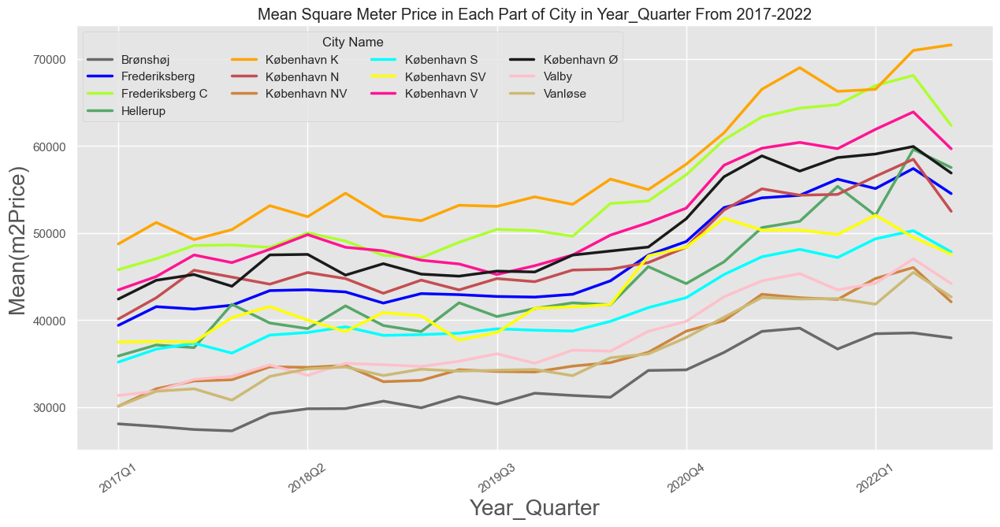

In [343]:
# M2 PRICE PR CITY OVER TIME
Variable = 'cityName'

ChooseDate = 'saleYear'
ChooseDate = 'Year_Quarter'
#ChooseDate = 'Year_Months'

from cycler import cycler

Postnummernavne = list(df.sort_values([Variable])[Variable].drop_duplicates())

 




a1 = df.loc[:, [ChooseDate, Variable, 'm2Price_WA']] 
a1.groupby([ChooseDate, Variable]).mean().unstack().plot( figsize = (15, 7),  linewidth=2.5, legend = False,color = ['dimgrey', 'blue', 'greenyellow', 'g', 'orange', 'r', 'peru', 'cyan', 'yellow', 'deeppink', 'k', 'pink', 'y', 'purple']  ) #Remove Kastrup and plot



linestyle_cycler = cycler('linestyle',['-','-','-','-','-','-','-','--','--','--','--','--','--'])
plt.rc('axes', prop_cycle=linestyle_cycler)


plt.legend(Postnummernavne, ncol =4, title = 'City Name')
plt.ylabel('Mean(m2Price)')
plt.xlabel(ChooseDate)
plt.title('Mean Square Meter Price in Each Part of City in ' + ChooseDate + ' From 2017-2022')
plt.xticks(rotation = 35)
#plt.xticks(list(df[ChooseDate].drop_duplicates().sort_values()))


#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/m2Price in City in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/m2Price in City in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
plt.show() 

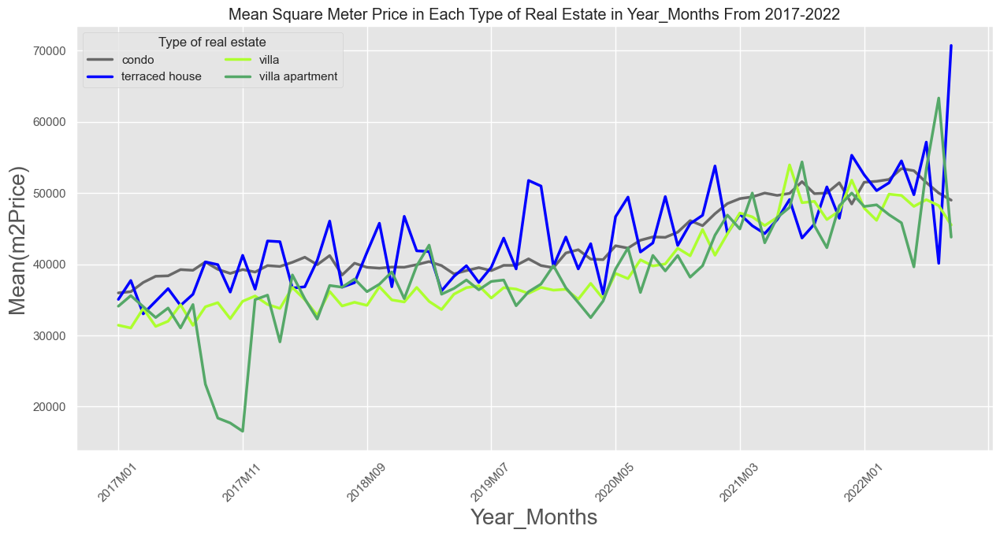

In [344]:

# M2 PRICE PR CITY OVER TIME
Variable = 'type'

ChooseDate = 'saleYear'
ChooseDate = 'Year_Quarter'
ChooseDate = 'Year_Months'



Postnummernavne = list(df.sort_values([Variable])[Variable].drop_duplicates())

 


a1 = df.loc[:, [ChooseDate, Variable, 'm2Price_WA']] 
a1.groupby([ChooseDate, Variable]).median().unstack().plot(figsize = (15, 7), linewidth=2.5, legend = False, color = ['dimgrey', 'blue', 'greenyellow', 'g', 'orange', 'r', 'peru', 'cyan', 'yellow', 'deeppink', 'k', 'pink', 'y', 'purple']  ) #Remove Kastrup and plot


plt.legend(Postnummernavne, ncol =2, title = 'Type of real estate')
plt.ylabel('Mean(m2Price)')
plt.xlabel(ChooseDate)
plt.title('Mean Square Meter Price in Each Type of Real Estate in ' + ChooseDate + ' From 2017-2022')
plt.xticks(rotation = 45)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/m2Price in Type of Real Estate in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/m2Price in Type of Real Estate in ' + ChooseDate + ' 17-22.png', bbox_inches='tight')
plt.show() 

In [345]:
def plot_outliers(df_input, list):

    nummerics = df_input[list]

    for i in range(len(nummerics.columns)):
        plt.figure(figsize=(10, 5))

        upperBound = (nummerics.loc[:, nummerics.columns[i]].mean())*2.75
        lowerBound = (nummerics.loc[:, nummerics.columns[i]].mean())*0.25

        sns.set_theme(style="whitegrid")
        ax = sns.boxplot(x=nummerics.loc[:, nummerics.columns[i]])

        plt.show()

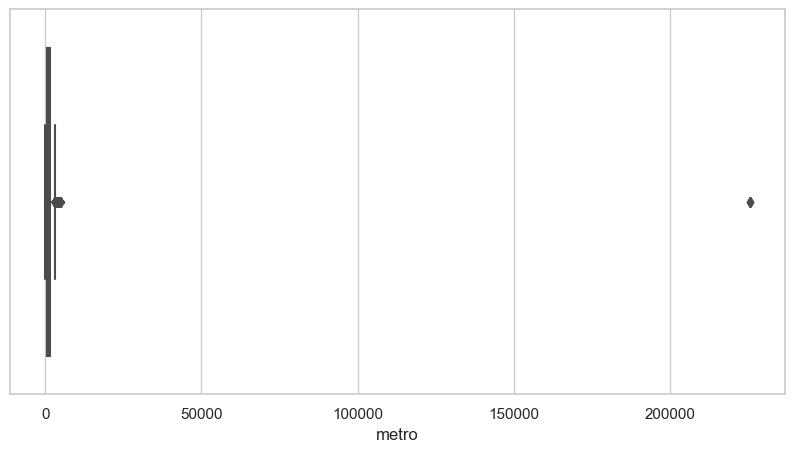

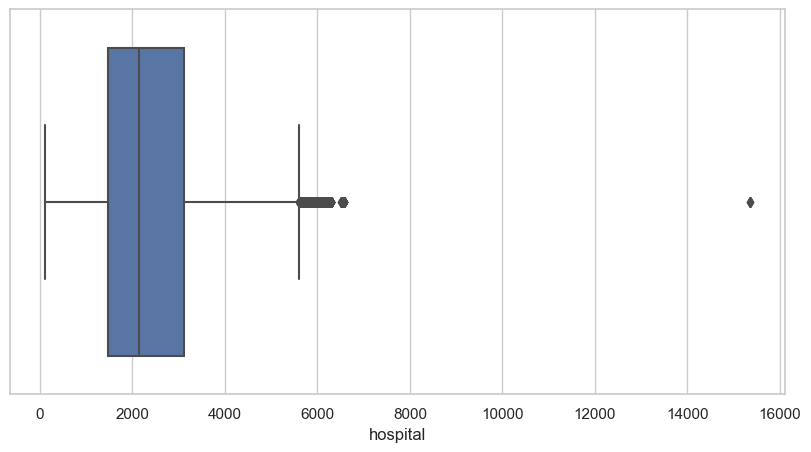

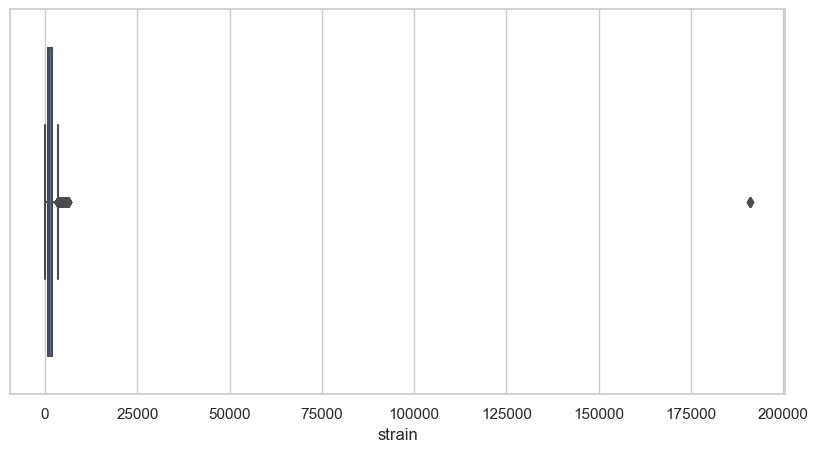

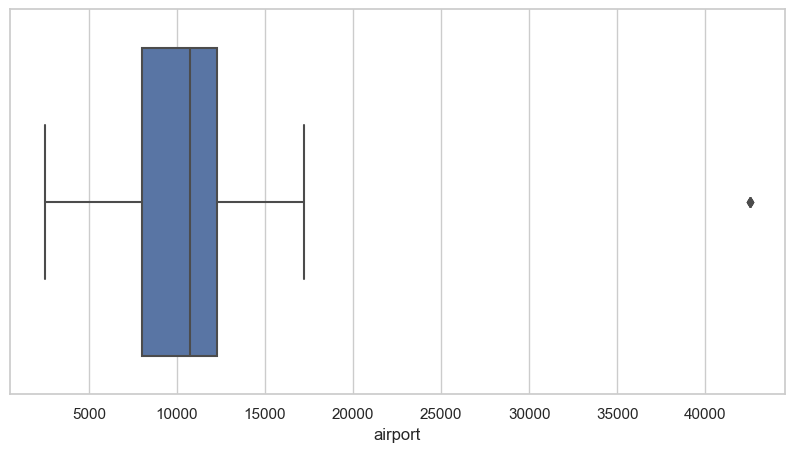

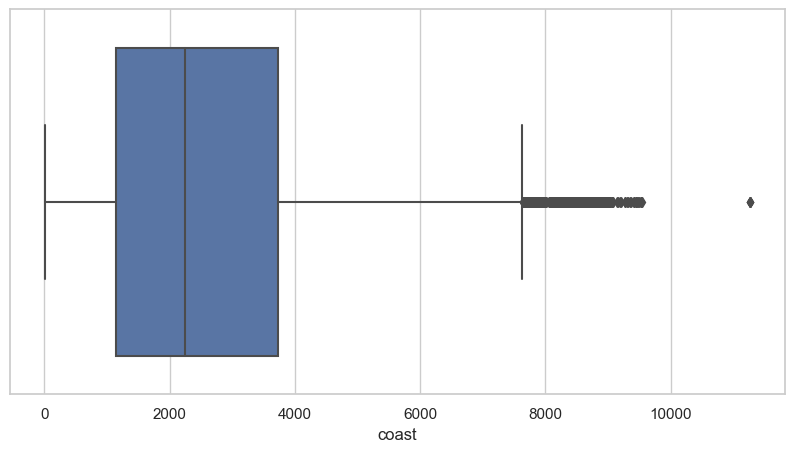

In [346]:
list_to_look_at = ['metro', 'hospital', 'strain', 'airport', 'coast']
plot_outliers(df,list_to_look_at)

In [347]:
df.loc[df['metro']>150000][['metro', 'hospital', 'strain', 'airport', 'coast']]

,metro,hospital,strain,airport,coast
7906,225540.38,15346.75,190932.41,42528.85,11263.62
8898,225540.38,15346.75,190932.41,42528.85,11263.62
13024,225540.38,15346.75,190932.41,42528.85,11263.62
29778,225540.38,15346.75,190932.41,42528.85,11263.62


In [348]:
len(df)

34108

In [349]:
#We start bydropping the above, and see if it help on all the ouliers in the plots. 
drop_outliers = list(df.loc[df['metro']>150000].index)
df.drop(drop_outliers, inplace=True)

In [350]:
len(df)

34104

In [351]:
#plot_outliers(df,list_to_look_at)

#It worked. It was the same address, and i could also see something went wrong in 
# the code of the website we got our data from. 
#
# https://hvorlangterder.poi.viamap.net/v1/nearestpoi/?poitypes=daycare,doctor,hospital,junction,metro,school,stop,strain,supermarket,train,library,pharmacy,coast,forest,lake,airport,sportshall,publicbath,soccerfield,roadtrain&fromaddress=Frederiksvej44Frederiksberg&mot=foot&token=eyJkcGZ4IjogImh2b3JsYW5ndGVyZGVyIiwgInByaXZzIjogInIxWjByMEYwazZCdFdxUWNPVXlrQi95NlNVcEp2MlFiZ3lYZXRxNEhZNFhPLzNZclcwK0s5dz09In0.fP4JWis69HmaSg5jVHiK8nemiCu6VaMULSGGJyK4D4PkWq4iA1+nSHWMaHxepKwJ83sEiy9nMNZhv7BcktRNrA

In [352]:
# it works better with the above upper and lower bound. which is with mean*0,25 and mean*2,75

lowerBound = (df["m2Price_WA"].mean())*0.25
upperBound = (df["m2Price_WA"].mean())*2



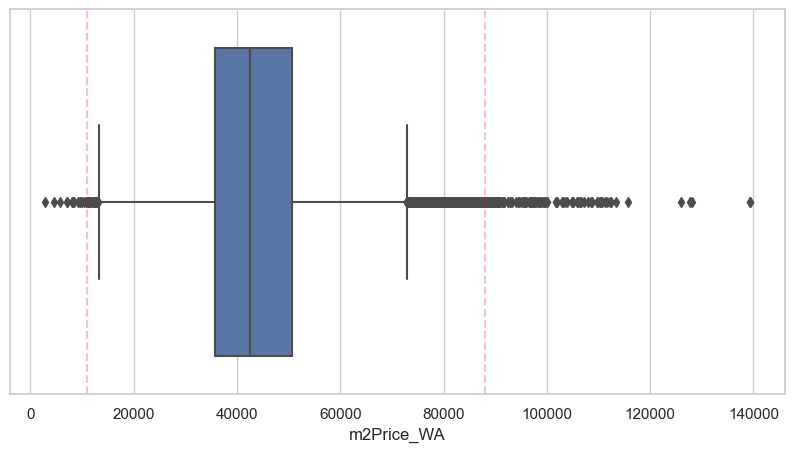

In [353]:
##### SQUARE METER PRICE OUTLIER --- BOXPLOT
plt.figure(figsize=(10, 5))
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["m2Price_WA"])
plt.axvline(x = lowerBound, linestyle = "--", alpha = 0.25, c = 'red')
plt.axvline(x = upperBound, linestyle = "--", alpha = 0.25, c = 'red')
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/BOXPLOT - m2 price outliers', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/BOXPLOT - m2 price outliers', bbox_inches='tight')
plt.show()

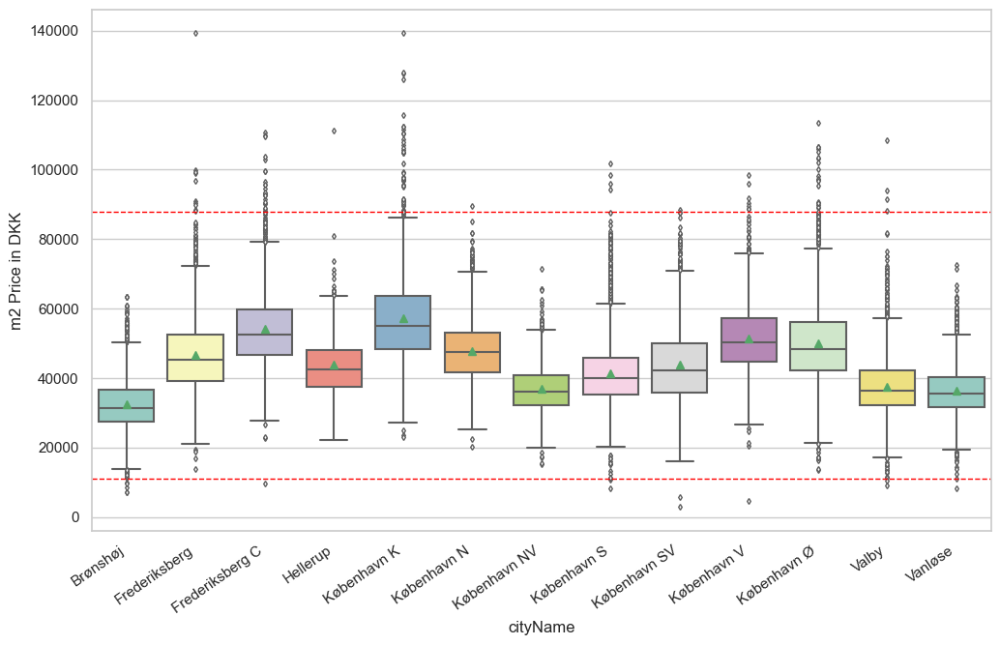

In [354]:
# # Boxplot with place variables

plt.rcParams["figure.figsize"] = (12,7)

flierprops = dict(markerfacecolor='1', markersize=3,
              linestyle='none')




g = sns.boxplot(x=df['cityName'], y=df['m2Price_WA'],  palette="Set3", flierprops=flierprops, showmeans=True)
plt.xticks(rotation=35, horizontalalignment='right')
plt.ylabel('m2 Price in DKK')



g.axhline(lowerBound, color = "red", lw = 1, ls='--')
g.axhline( upperBound, color = "red", lw = 1, ls='--')

#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/m2 price median for cityName in 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' +  '/m2 price median for cityName in 17-22.png', bbox_inches='tight')
plt.show()

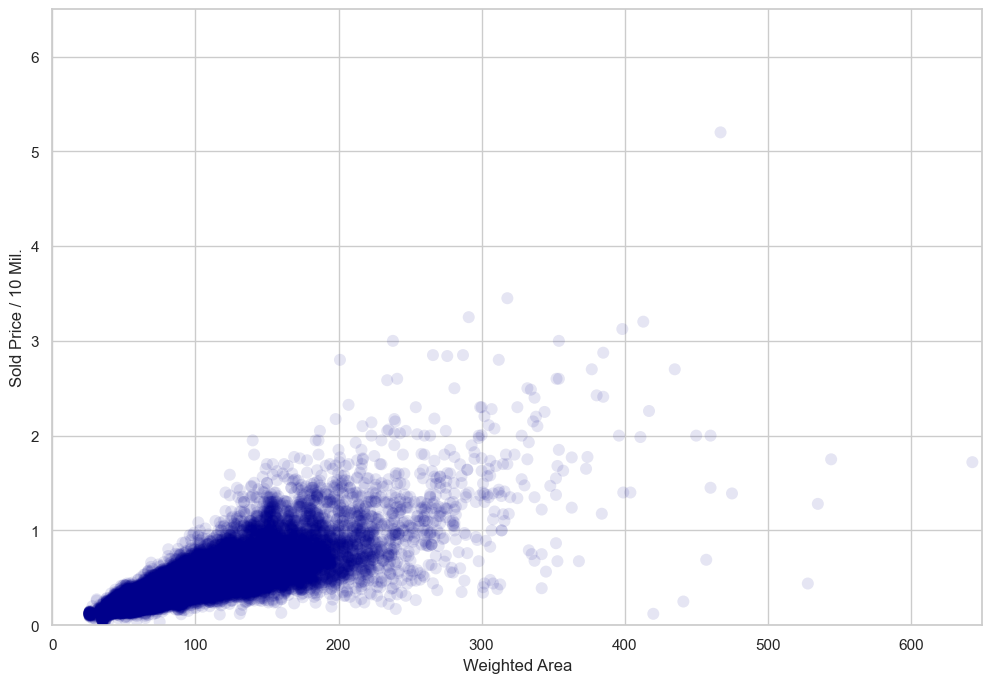

In [355]:
##### PRICE VS AREA --- OUTLIER VISUALIZATION

plt.rcParams["figure.figsize"] = (12,8)

fig, ax = plt.subplots()

# Plot data
plt.scatter(df['weighted_area'], (df['sold_price']/(1e7)), #Divided with 10 Mill.
            edgecolors='none', alpha=0.1, c ='darkblue', s = 75)

plt.xlim(0, 650)
plt.ylim(0, 6.5)
plt.xlabel('Weighted Area')
plt.ylabel('Sold Price / 10 Mil.')
plt.show()

mean: 43980.8862258782
outliers:131


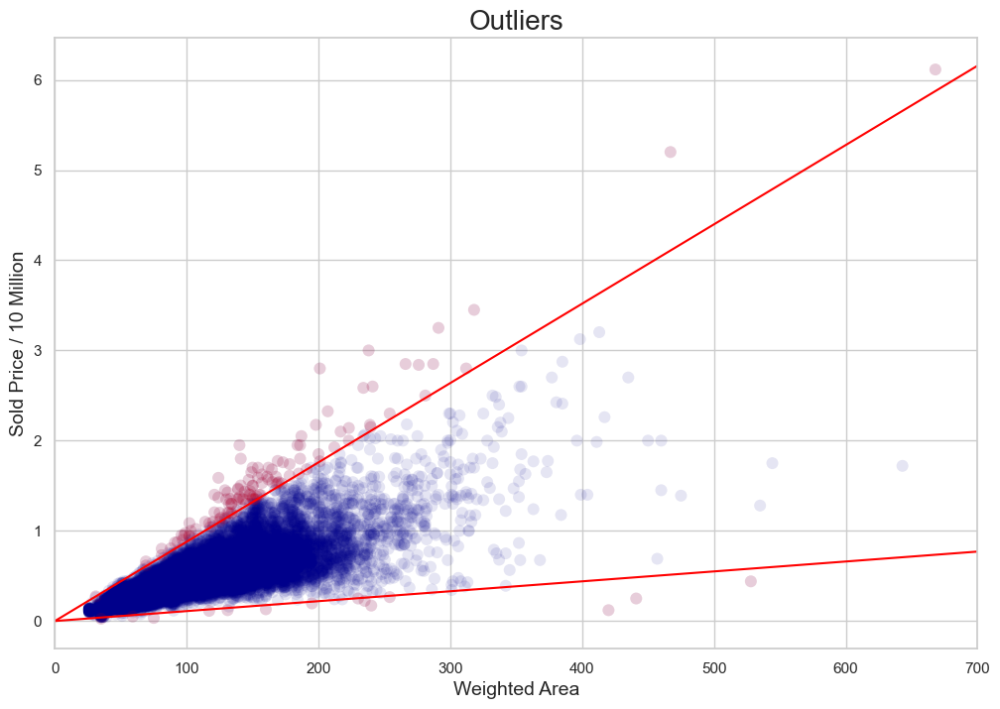

In [356]:

### WITH EXCLUSIONS

mean = df['m2Price_WA'].mean()
print('mean: ' + str(mean)) #Now: 43980.88, with the raw_data_final_final_old it was 44680.54
 
outliers = df.loc[(df['m2Price_WA']> upperBound) | (df['m2Price_WA']< lowerBound),:]
print('outliers:' + str(len(outliers)))#Now: 131, with the raw_data_final_final_old it was 328 

plt.rcParams["figure.figsize"] = (12,8)

fig, ax = plt.subplots()

# Plot data
plt.scatter(df['weighted_area'], (df['sold_price']/(1e7) ),
            edgecolors='none', alpha=0.1, c ='darkblue', s = 75)
plt.scatter(outliers['weighted_area'], (outliers['sold_price']/(1e7) ),
            edgecolors='none', alpha=0.1, c ='red', s = 75)
            

x = np.array([0, 100, 200, 300, 400, 500, 600, 700])
plt.plot(x, lowerBound*x/(1e7) , c ='red')
plt.plot(x, upperBound*x/(1e7) , c ='red')

plt.rc('axes', labelsize=20)

plt.xlim(0, 700)

plt.xlabel('Weighted Area', fontsize = 14)
plt.ylabel('Sold Price / 10 Million', fontsize = 14)
plt.title('Outliers', fontsize = 20)
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/OutliersCleaned.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/OutliersCleaned.png', bbox_inches='tight')
plt.show()

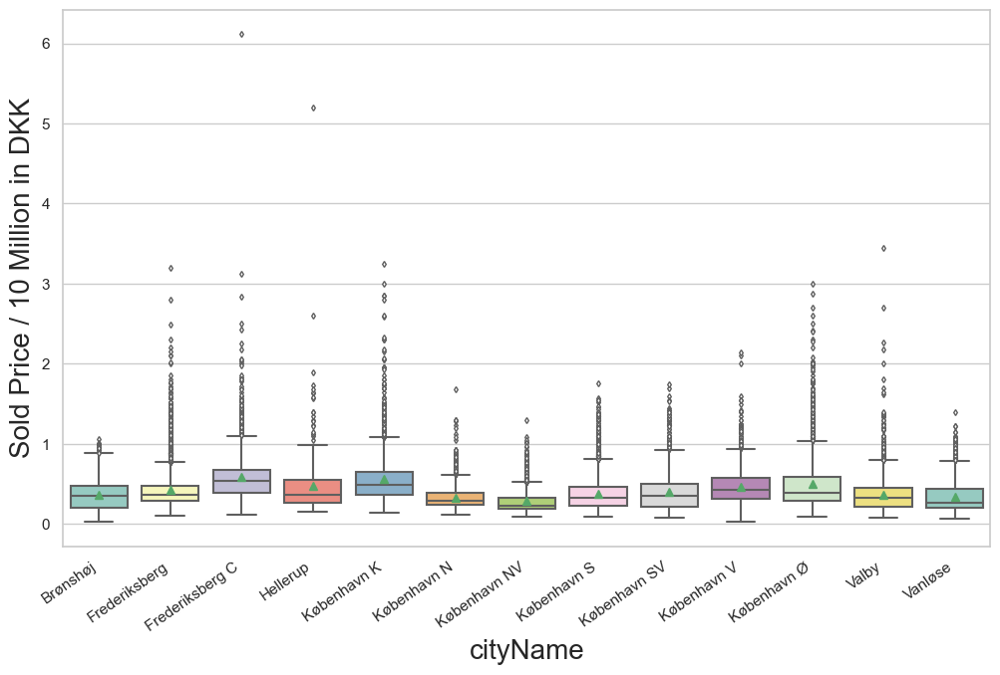

In [357]:
# # Boxplot with place variables

plt.rcParams["figure.figsize"] = (12,7)

flierprops = dict(markerfacecolor='1', markersize=3,
              linestyle='none')

sns.boxplot(x=df['cityName'], y=df['sold_price']/1e7,  palette="Set3", flierprops=flierprops, showmeans=True)
plt.xticks(rotation=35, horizontalalignment='right')
plt.ylabel('Sold Price / 10 Million in DKK')
#plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Sold price median for cityName in 17-22.png', bbox_inches='tight')
#plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' +  '/Sold price median for cityName in 17-22.png', bbox_inches='tight')
plt.show()

In [358]:
len(df)

34104

In [359]:
drop_outliers = list(df.loc[df['m2Price_WA'].isin(outliers['m2Price_WA'])].index)
df.drop(drop_outliers, inplace=True)

In [360]:
len(df)

33973

In [361]:
#outliers['sold_price']/(1e7) #Divideret med 10 millioner ligesom på grafen ovenover

In [362]:
print('Øvre grænse med mean  : ' + str(round(upperBound, 5))) #Divideret med 10 millioner ligesom på grafen ovenover
print('Nedre grænse med mean : ' + str(round(lowerBound, 5))) #Divideret med 10 millioner ligesom på grafen ovenover

Øvre grænse med mean  : 87961.77245
Nedre grænse med mean : 10995.22156


* ### Cross tabulation


In [363]:
print(pd.crosstab(df['usageType'], df['type'], margins = False).to_latex(index=True))

\begin{tabular}{lrrrr}
\toprule
type &  condo &  terraced house &  villa &  villa apartment \\
usageType                                          &        &                 &        &                  \\
\midrule
Dobbelthus                                         &      5 &             110 &    301 &                3 \\
Etagebolig-bygning, flerfamiliehus eller tofami... &  28140 &              51 &     60 &             1084 \\
Fritliggende enfamilieshus (parcelhus)             &     14 &               5 &   2886 &                4 \\
Række- og kædehus                                  &     39 &            1151 &    118 &                2 \\
\bottomrule
\end{tabular}



In [364]:
pd.crosstab(df['usageType'], df['type'], margins = False)

type,condo,terraced house,villa,villa apartment
usageType,,,,
Dobbelthus,5,110,301,3
"Etagebolig-bygning, flerfamiliehus eller tofamiliehus",28140,51,60,1084
Fritliggende enfamilieshus (parcelhus),14,5,2886,4
Række- og kædehus,39,1151,118,2


In [365]:
a = 5+110+301+3
b = 28140+51+60+1084
c= 14+5+2886+4
d= 39+1151+118+2
a+b+c+d #33973

33973

In [366]:
e = 5+28140+14+39
f= 110+51+5+1151
g=301+60+2886+118
h=3+1084+4+2
e+f+g+h

33973


& Etagebolig-bygning, flerfamiliehus eller tofami... &  28.140 &              51 &     60 &             1084  &  29.335\\ \cline{2-7} 
& Række- og kædehus                                  &     39 &            1.151 &    118 &                2 & 1.310\\ \cline{2-7} 
& Fritliggende enfamilieshus (parcelhus)             &     14 &               5 &   2.886 &                4 & 2.909\\ \cline{2-7} 
& Dobbelthus                                         &      5 &             110 &    301 &                3  & 419 \\ \cline{2-7} 
\multicolumn{1}{c}{} & \multicolumn{1}{c|}{$\sum$} & 28.198 & 1.317 & 3.365 & 1.093 & 33.973\\

In [367]:
print('a = ' + str(a))
print('b = ' + str(b))
print('c = ' + str(c))
print('d = ' + str(d))
print('e = ' + str(e))
print('f = ' + str(f))
print('g = ' + str(g))
print('h = ' + str(h))

a = 419
b = 29335
c = 2909
d = 1310
e = 28198
f = 1317
g = 3365
h = 1093


In [368]:
df.drop(columns='usageType', inplace=True) #We remove usageType

In [369]:
len(df)

33973

In [370]:
len(df.columns)

88

* ### Numerical variables

In [371]:
DontUseVar  = ['AVM_price', 'latest_prop_valuation', 'Year_Week', 'Year_Months', 'Year_Quarter', 'addressName', 'addressNumber', 'addressDoor', 'address_id', 'saleDate', 'saleYear']

In [372]:
df_use = df.drop(columns=DontUseVar)

In [373]:
round(df_use.describe().T[['count', 'mean', '50%', 'min', 'max']], 2)


,count,mean,50%,min,max
energy_law_applies,33973.0,0.89,1.00,0.00,1.00
presale,33973.0,0.03,0.00,0.00,1.00
year_built,33973.0,1938.79,1934.00,1750.00,2021.00
year_renovated,4426.0,1977.12,1976.00,1860.00,2022.00
sold_price,33973.0,4070268.32,3500000.00,420000.00,32025000.00
...,...,...,...,...,...
Population,33973.0,538470.12,623404.00,102940.00,646812.00
AnnualisedAgreedRate,33973.0,1.79,1.72,1.33,3.29
ElPrice_incl_moms_4000kWh,33973.0,238.75,230.90,206.80,391.82
BenzinPrice_incl_moms,33973.0,12.42,11.98,9.88,18.98


In [374]:
print(round(df_use.describe().T[[ 'count', 'mean', '50%', 'min','max']], 2).to_latex(index=True))

\begin{tabular}{lrrrrr}
\toprule
{} &    count &        mean &         50\% &        min &          max \\
\midrule
energy\_law\_applies                       &  33973.0 &        0.89 &        1.00 &       0.00 &         1.00 \\
presale                                  &  33973.0 &        0.03 &        0.00 &       0.00 &         1.00 \\
year\_built                               &  33973.0 &     1938.79 &     1934.00 &    1750.00 &      2021.00 \\
year\_renovated                           &   4426.0 &     1977.12 &     1976.00 &    1860.00 &      2022.00 \\
sold\_price                               &  33973.0 &  4070268.32 &  3500000.00 &  420000.00 &  32025000.00 \\
num\_floors                               &  33973.0 &        1.11 &        1.00 &       1.00 &         3.00 \\
floors\_in\_building                       &  33973.0 &        4.42 &        5.00 &       1.00 &        30.00 \\
num\_rooms                                &  33973.0 &        3.15 &        3.00 &       1.00 &    

In [375]:
#We drop renovated year because of lack of infomation and a median in year 1976 and only 87 observation in the period 2016-2022
df.drop(columns='year_renovated', inplace=True)

# Encoding

* ## Ordinal variables
Ordinal variables have a clear ordering of their categories, such as best to worst in whichever
scale the measuring is done

In [376]:
len(df.columns)

87

In [377]:
df['conservationValue']

0         Ingen bevaringsværdi
1        Middel bevaringsværdi
2         Ingen bevaringsværdi
3         Ingen bevaringsværdi
4         Ingen bevaringsværdi
                 ...          
34197     Ingen bevaringsværdi
34198     Ingen bevaringsværdi
34199     Ingen bevaringsværdi
34200     Ingen bevaringsværdi
34201    Middel bevaringsværdi
Name: conservationValue, Length: 33973, dtype: category
Categories (4, object): ['Ingen bevaringsværdi', 'Lav bevaringsværdi', 'Middel bevaringsværdi', 'Høj bevaringsværdi']

In [378]:

ordered_Energy = ['G', 'F', 'E', 'D' , 'C', 'B','A']#['A', 'B', 'C', 'D', 'E', 'F', 'G']
ordered_RadonRisk = ['Meget lav', 'lav', 'medium', 'høj']
ordered_NoiseLvl = ['Ingen trafikstøj', '55-60 dB','60-65 dB','65-70 dB','over 70 dB']
ordered_FloodRisk = ['er lav risiko', 'kan være risiko', 'er høj risiko']
ordered_BurglaryRisk = ['lav', 'mellem', 'høj']
ordered_ConservationValue = ['Ingen bevaringsværdi', 'Lav bevaringsværdi', 'Middel bevaringsværdi', 'Høj bevaringsværdi']


In [379]:
df['energy_label_classification'] = df['energy_label_classification'].cat.set_categories(ordered_Energy, ordered = True)
df['radonRisk'] = df['radonRisk'].cat.set_categories(ordered_RadonRisk, ordered = True)
df['noiseLvl'] = df['noiseLvl'].cat.set_categories(ordered_NoiseLvl, ordered = True)
df['floodRisk'] = df['floodRisk'].cat.set_categories(ordered_FloodRisk, ordered = True)
df['burglaryRisk'] = df['burglaryRisk'].cat.set_categories(ordered_BurglaryRisk, ordered = True)
df['conservationValue'] = df['conservationValue'].cat.set_categories(ordered_ConservationValue, ordered = True)


In [380]:
df['energy_label_classification'] 

0        C
1        D
2        E
3        A
4        D
        ..
34197    D
34198    C
34199    A
34200    A
34201    D
Name: energy_label_classification, Length: 33973, dtype: category
Categories (7, object): ['G' < 'F' < 'E' < 'D' < 'C' < 'B' < 'A']

In [381]:
########################################################################
#We wait to do this in our 4. Linear model and 5. Neural Network files. 
########################################################################

# map_Energy = {'A':7, 'B':6, 'C':5, 'D':4, 'E':3, 'F':2, 'G':1}
# map_RadonRisk = {'Meget lav':1, 'lav':2, 'medium':3, 'høj':4}
# map_NoiseLvl = {'Ingen trafikstøj':1, '55-60 dB':2, '60-65 dB':3, '65-70 dB':4, 'over 70 dB':5}
# map_FloodRisk = {'er lav risiko':1, 'kan være risiko':2, 'er høj risiko':3}
# map_BurglaryRisk = {'lav':1, 'mellem':2, 'høj':3}
# map_ConservationValue = {'Ingen bevaringsværdi':1, 'Lav bevaringsværdi':2, 'Middel bevaringsværdi':3, 'Høj bevaringsværdi':4}

In [382]:
# df['energy_label_classification'] = df['energy_label_classification'].map(map_Energy)
# df['radonRisk'] = df['radonRisk'].map(map_RadonRisk)
# df['noiseLvl'] = df['noiseLvl'].map(map_NoiseLvl)
# df['floodRisk'] = df['floodRisk'].map(map_FloodRisk)
# df['burglaryRisk'] = df['burglaryRisk'].map(map_BurglaryRisk)
# df['conservationValue'] = df['conservationValue'].map(map_ConservationValue)

* ### One-hot encoding

In [383]:
#We drop municipality because it is too similar to city_names when we drop one, then it would be copenhagen, and it will only be 0 where Frederiksberg C and Frederiksberg are mentioned. 
df.drop(columns='municipality', inplace=True)

And now we do one-hot encoding

In [384]:
df = pd.get_dummies(df, columns=['type', 'bathroomType', 'roofType', 'outWallMaterialType', 'heating_code', 'heating_code_additional', 'cityName', 'biggestParty'], drop_first=True)




In [385]:
len(df.columns)

105

# Correlation

In [386]:
df.rename({'ForcedSalesOfPropertyInRegionHovedstaden': 'ForcedSalesOfProperty'}, axis=1, inplace=True) 

In [387]:
def plot_correlation2(df_input, FocusVariable, FocusVariable2 ):

    df_ = df_input.copy()

    DontUseVar  = ['AVM_price', 'latest_prop_valuation', 'Year_Week', 'Year_Months', 'Year_Quarter', 'addressName', 'addressNumber', 'addressDoor', 'address_id', 'saleDate', 'saleYear']

    df_ = df_.drop(columns=DontUseVar)

    corr_matrix = df_.corr(method='pearson')

    positive_correlated = list(corr_matrix[FocusVariable].sort_values(ascending=False).head(20).index)#20 most positive correlated
    negative_correlated = list(corr_matrix[FocusVariable].sort_values(ascending=False).tail(10).index)#10 most negative correlated

    most_correlated = positive_correlated + negative_correlated #These are the 30 variables with most correlation 
    #The above variables we need to use in our corr_matrix in the columns and the rows. 
    plot_corr_matrix = corr_matrix.loc[most_correlated, most_correlated]

    positive_correlated2 = list(corr_matrix[FocusVariable2].sort_values(ascending=False).head(20).index)#20 most positive correlated
    negative_correlated2 = list(corr_matrix[FocusVariable2].sort_values(ascending=False).tail(10).index)#10 most negative correlated

    most_correlated2 = positive_correlated2 + negative_correlated2 #These are the 30 variables with most correlation 
    #The above variables we need to use in our corr_matrix in the columns and the rows. 
    plot_corr_matrix2 = corr_matrix.loc[most_correlated2, most_correlated2]


    mask_0 = np.zeros_like(plot_corr_matrix, dtype=np.bool_)
    mask_0[np.tril_indices_from(mask_0)] = True


    mask_1 = np.zeros_like(plot_corr_matrix2, dtype=np.bool_)
    mask_1[np.tril_indices_from(mask_1)] = True
    mask_1 = mask_1.T


    plt.figure(figsize=(16,8))
    fig, (ax,ax2) = plt.subplots(ncols=2)


    fig = plt.gcf()  # or by other means, like plt.subplots
    figsize = fig.get_size_inches()
    fig.set_size_inches(figsize * 2) 

    sns.heatmap(plot_corr_matrix,  mask= mask_0,  ax=ax, vmax=1, center=0, linewidths=.1, annot_kws={"size": 10}, annot=True, fmt='.2f', cbar=False, cmap='coolwarm')



    sns.heatmap(plot_corr_matrix2, mask= mask_1,  ax=ax2, vmax=1, vmin=-1, center=0, linewidths=.1,annot_kws={"size": 10}, annot=True, fmt='.2f', cbar=False, cmap='coolwarm')


    

    ax2.yaxis.tick_right()
    ax2.tick_params(axis='y', rotation=0)

    #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Correlation ' + FocusVariable + ' and ' + FocusVariable2 + '.png', bbox_inches='tight')
    #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Correlation ' + FocusVariable + ' and ' + FocusVariable2 + '.png', bbox_inches='tight')

    plt.show()


    
        

<Figure size 1600x800 with 0 Axes>

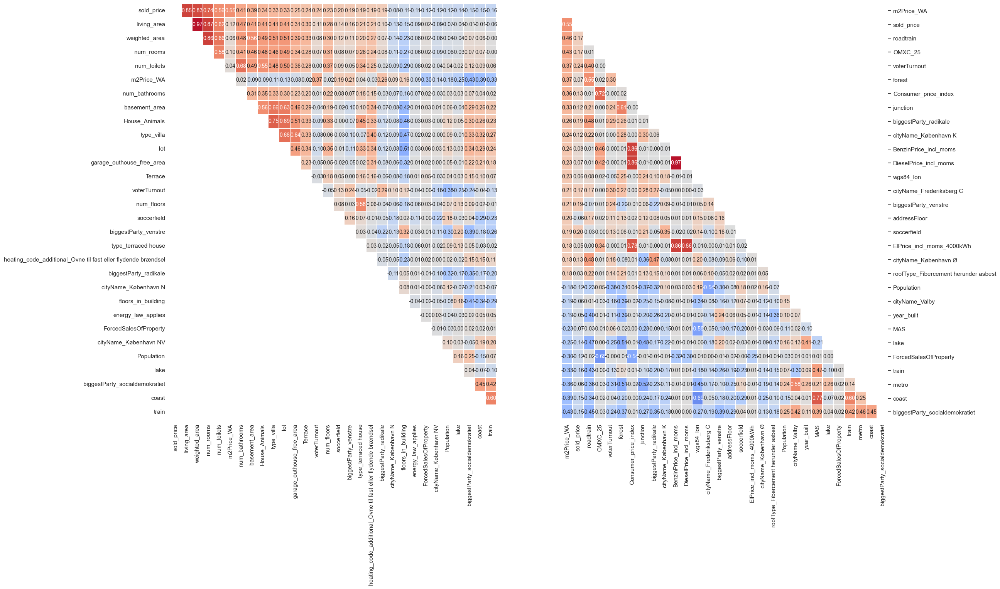

In [388]:
plot_correlation2(df, 'sold_price', 'm2Price_WA')

In [389]:
def plot_correlation(df_input, FocusVariable):

        df_ = df_input.copy()
        DontUseVar  = ['AVM_price', 'latest_prop_valuation', 'Year_Week', 'Year_Months', 'Year_Quarter', 'addressName', 'addressNumber', 'addressDoor', 'address_id', 'saleDate', 'saleYear']

        if FocusVariable=='sold_price':
                df_.drop(columns=['m2Price_WA'], inplace=True)
        elif FocusVariable=='m2Price_WA':
                df_.drop(columns=['sold_price', 'weighted_area'], inplace=True)
        else:
                pass

        


        df_ = df_.drop(columns=DontUseVar)

        corr_matrix = df_.corr(method='pearson')
        
        positive_correlated = list(corr_matrix[FocusVariable].sort_values(ascending=False).head(20).index)#20 most positive correlated
        negative_correlated = list(corr_matrix[FocusVariable].sort_values(ascending=False).tail(10).index)#10 most negative correlated

        most_correlated = positive_correlated + negative_correlated #These are the 30 variables with most correlation 
        #The above variables we need to use in our corr_matrix in the columns and the rows. 
        plot_corr_matrix = corr_matrix.loc[most_correlated, most_correlated]


        
        mask_1=np.triu(plot_corr_matrix)
        np.fill_diagonal(mask_1, False)

        plt.rcParams['font.size'] = 10
        



        #We use the most correlated for our focus Variabel, as we found above. 
        heat_map = sns.heatmap(plot_corr_matrix, mask=mask_1, vmax=1, center=0, xticklabels=True, yticklabels=True,
                square=True, linewidths=.1, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
        
      
        heat_map.figure.set_size_inches(15,15)
        #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Correlation ' + FocusVariable + '.png', bbox_inches='tight')
        #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' + '/Correlation ' + FocusVariable + '.png', bbox_inches='tight')
        plt.show()

        return most_correlated
    

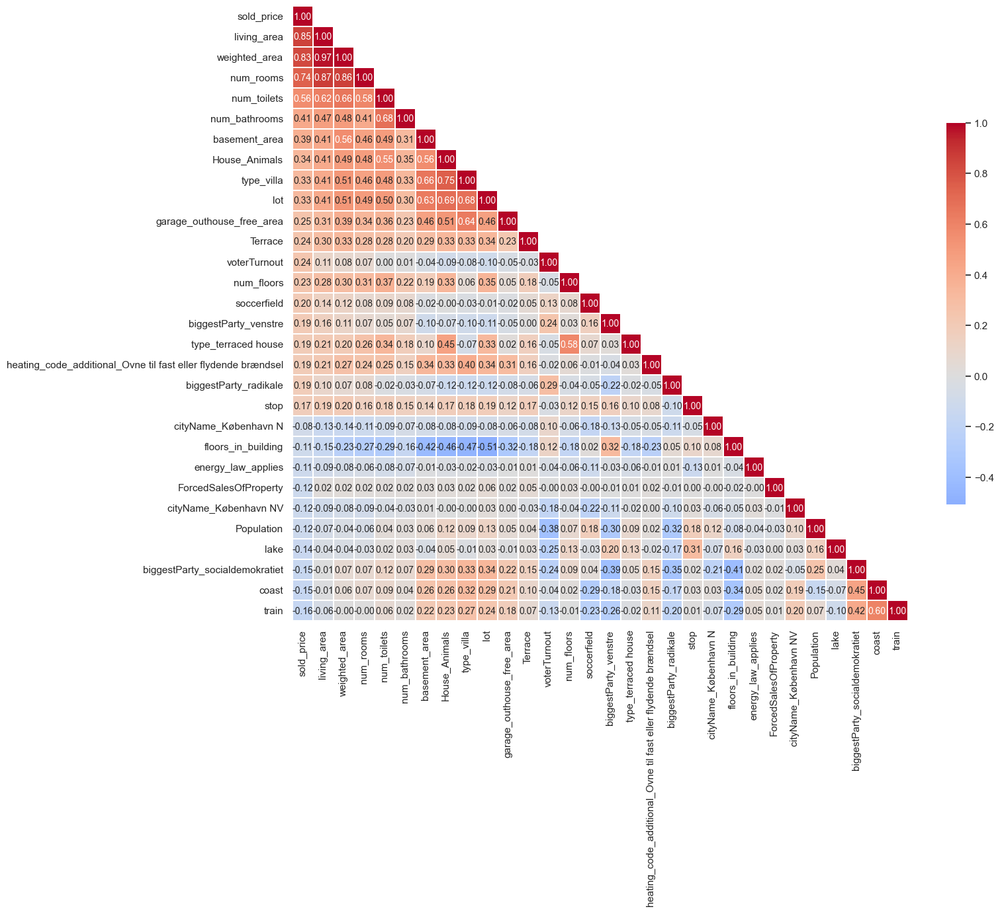

In [390]:
most_correlated_with_soldPrice = plot_correlation(df, 'sold_price')

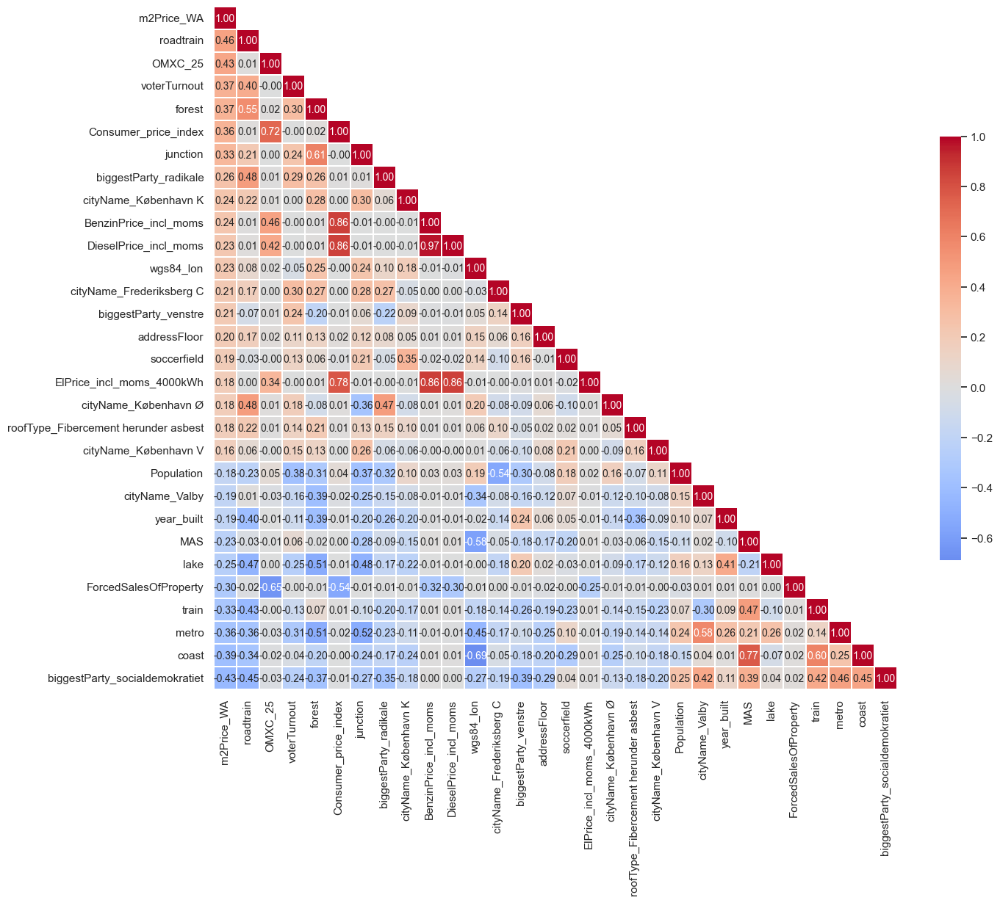

In [391]:
most_correlated_with_m2Price = plot_correlation(df, 'm2Price_WA')

In [393]:
############################################################################
#### For the rest of variables which didn't showed in the above figures ####
############################################################################

df_ = df.copy()
DontUseVar  = ['AVM_price', 'latest_prop_valuation', 'Year_Week', 'Year_Months', 'Year_Quarter', 'addressName', 'addressNumber', 'addressDoor', 'address_id', 'saleDate', 'saleYear']



df_.drop(columns=list(DontUseVar), inplace=True)

corr_matrix = df_.corr(method='pearson')
corr_list = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool)).stack().sort_values(ascending=False))


In [405]:
round(corr_list[abs(corr_list)>0.9], 2)

BenzinPrice_incl_moms  DieselPrice_incl_moms    0.97
living_area            weighted_area            0.97
long_rate              AnnualisedAgreedRate     0.91
dtype: float64

In [395]:
def plot_the_most_correlated_data(df_inpput, mostCorrelatedVariables, FocusVariable):
    count = 0
    for i in range(int(len(mostCorrelatedVariables)/5.0)): #We know that the variable list is 30 long, so we plot 5x6
        sns.set(font_scale=0.8)
        sns.pairplot(data=df_inpput,
                  y_vars=mostCorrelatedVariables[0],
                  x_vars=mostCorrelatedVariables[count:(count+5)])
        count = count + 5
        
        #plt.savefig('C:/Users/Mtubo/Desktop/Uni/Kandidat/Thesis/Kode/Figures' + '/Correlated data with ' + FocusVariable + str(i+1) + '.png', bbox_inches='tight')
        #plt.savefig('C:/Users/Mtubo/Dropbox/Apps/Overleaf/Thesis 2022/Figures' +'/Correlated data with ' + FocusVariable + str(i+1) + '.png', bbox_inches='tight')
    return

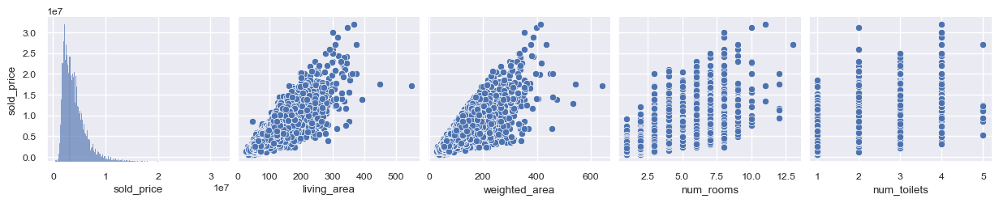

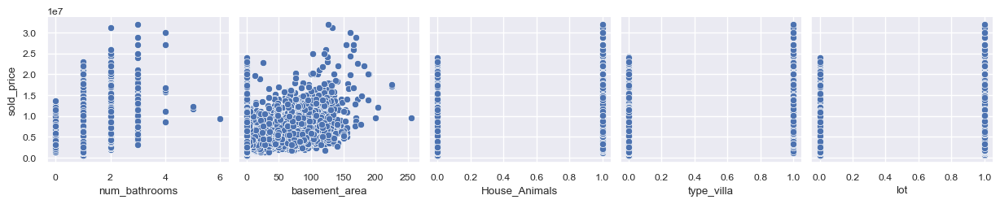

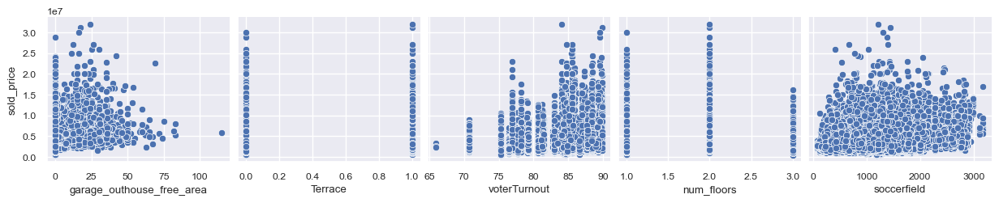

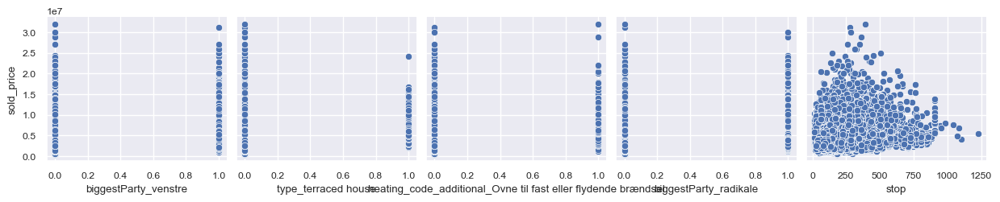

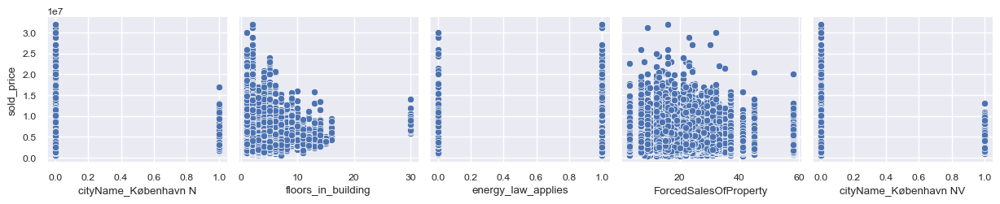

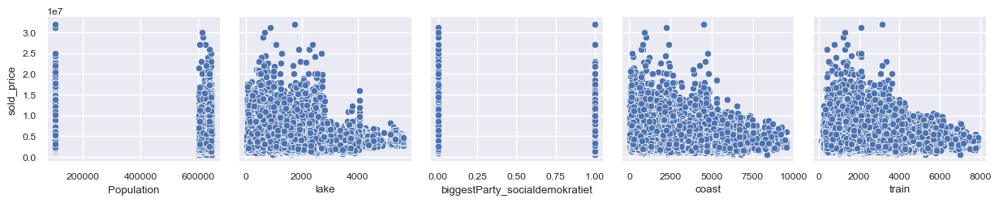

In [396]:
plot_the_most_correlated_data(df, most_correlated_with_soldPrice, 'sold_price')

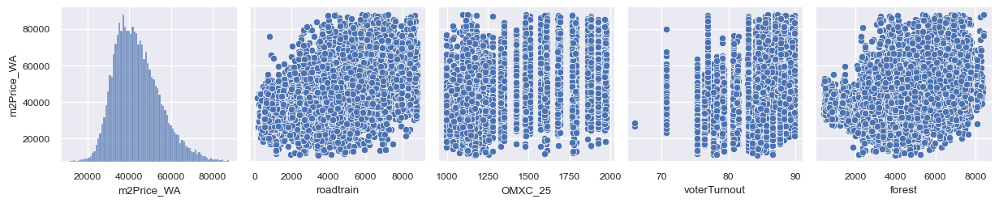

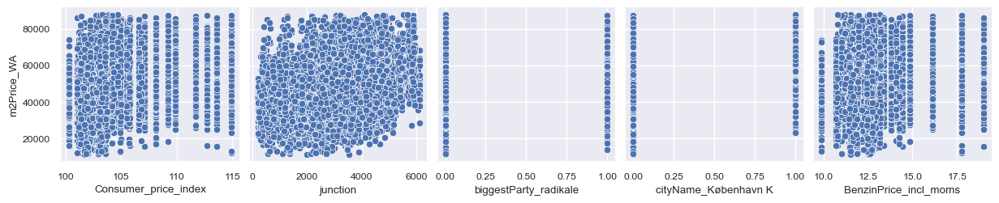

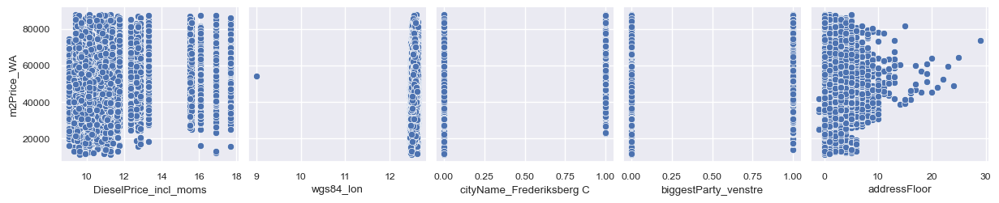

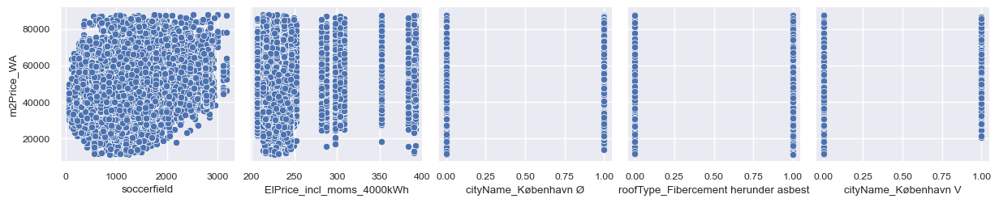

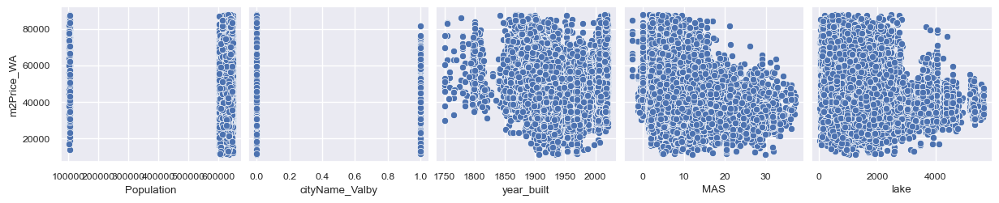

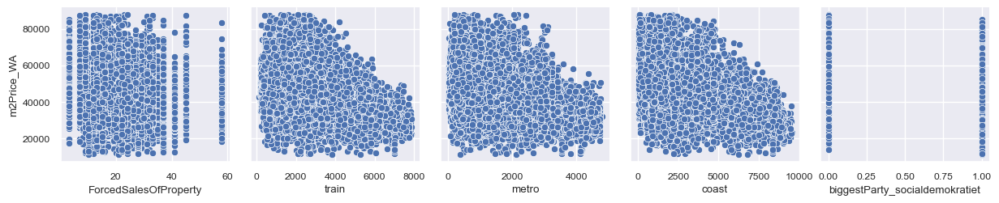

In [397]:
plot_the_most_correlated_data(df, most_correlated_with_m2Price, 'm2Price')

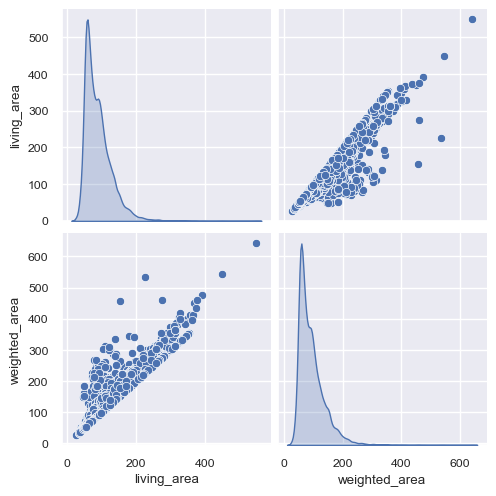

In [398]:
sns.pairplot(df[['living_area','weighted_area']], diag_kind='kde')

In [399]:
print('weighted_area == living_area is : ' + str(round((len(df.loc[df['weighted_area']==df['living_area']])/len(df))*100 , 2)) + '%')
print('weighted_area NE living_area is : ' + str(round((len(df.loc[df['weighted_area']!=df['living_area']])/len(df))*100 , 2)) + '%')

weighted_area == living_area is : 85.56%
weighted_area NE living_area is : 14.44%


In [400]:
#################################################################
#### DELETION OF living_area,  Diesel & AnnualisedAgreedRata ####
#################################################################

df.drop(columns=['living_area', 'DieselPrice_incl_moms', 'AnnualisedAgreedRate'], inplace=True)

In [406]:
print('Rows    : ' + str(len(df)))
print('Coloumns: ' +  str(len(df.columns)))

Rows    : 33973
Coloumns: 102


In [402]:
#df.to_csv('model_Data_17_Nov.csv', index = False)
#df.to_excel("model_Data_17_Nov.xlsx")


## List without and with balcony if sold more than 1 time in the period
We check if some of the duplicates, have been sold without and with an balcony, then it should have come the latter. 

In [403]:
#Balconys_build = read_saved_excel("ListeMedAltanerDerErBygget.xlsx")

In [404]:
#df.loc[df['address_id'].duplicated()].loc[df['Balcony']>0]['address_id'].drop_duplicates() Balconys_build

We have 1784 address there have been sold more than one time, and in the periode from the first sale, there have been build a balcony. 